In [ ]:
import ee
from IPython.display import Image

# Authenticate to the Earth Engine servers
ee.Authenticate()
ee.Initialize()

Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.


Contents of indices_df:
        Date      NDVI      NDWI       GCI             Shapefile  Backscatter
0 2022-06-07  0.551246  0.316113  1.892590  AgriculturalLand.shp          NaN
1 2022-06-18  0.258405  0.272823  0.797663  AgriculturalLand.shp          NaN
2 2022-06-25  0.041450  0.074342  0.139462  AgriculturalLand.shp          NaN
3 2022-06-28  0.417988  0.265806  1.224206  AgriculturalLand.shp          NaN
4 2022-06-30  0.479550  0.228529  1.485154  AgriculturalLand.shp          NaN
Contents of data_df:
        Date  Temperature  DewpointTemperature  Precipitation  WindSpeed
0 2022-06-01   283.745331           280.995255   2.317131e-05   4.368973
1 2022-06-01   283.644119           280.923111   0.000000e+00   3.455900
2 2022-06-01   283.391724           280.969757   0.000000e+00   2.316059
3 2022-06-01   282.835464           281.140518   0.000000e+00   1.527235
4 2022-06-01   282.791382           281.369995   8.568168e-07   1.471557
Contents of combined_df:
        Date      NDVI  

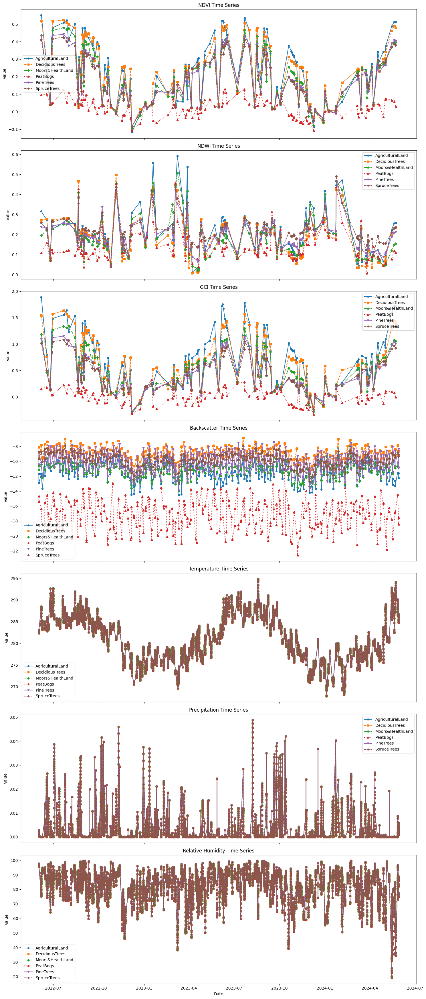

In [4]:
import geemap
import ee
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import os

# Initialize the Earth Engine module.
ee.Initialize()

# Function to calculate relative humidity
def calculate_relative_humidity(temp, dewpoint_temp):
    return 100 - 5 * (temp - dewpoint_temp)

# Define the function to calculate NDVI, NDWI, and GCI
def calculate_indices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    ndwi =  image.normalizedDifference(['B8', 'B11']).rename('NDWI');
    gci = image.expression('(NIR / GREEN) - 1', {
        'NIR': image.select('B8'),
        'GREEN': image.select('B3')
    }).rename('GCI')
    date = image.date().format('YYYY-MM-dd')
    return image.addBands([ndvi, ndwi, gci]).set('date', date)

# Define the function to calculate backscatter
def calculate_backscatter(image):
    backscatter = image.select('VV').rename('Backscatter')
    date = image.date().format('YYYY-MM-dd')
    return image.addBands(backscatter).set('date', date)


# Path to the folder containing the shapefiles.
shp_folder = 'Shapefiles/'

# List of shapefiles in the folder.
shapefiles = ['AgriculturalLand.shp', 'DecidiousTrees.shp', 'Moors&HealthLand.shp', 'PeatBogs.shp', 'PineTrees.shp', 'SpruceTrees.shp']

# Function to check if the shapefile exists
def shapefile_exists(path):
    return os.path.exists(path)

# DataFrame to store indices time series.
indices_df = pd.DataFrame()

# Define the date range.
start_date = '2022-06-01'
end_date = '2024-05-31'

# Process each shapefile.
for shp in shapefiles:
    shp_path = os.path.join(shp_folder, shp)
    
    if not shapefile_exists(shp_path):
        print(f"Shapefile {shp_path} does not exist.")
        continue

    # Load the shapefile.
    shapefile_fc = geemap.shp_to_ee(shp_path)
    
    if shapefile_fc is None:
        print(f"Could not load shapefile {shp_path}.")
        continue

    geometry = shapefile_fc.geometry()

    # Load Sentinel-2 image collection, filter by cloud cover, and sort by cloud cover percentage.
    s2_collection = (ee.ImageCollection('COPERNICUS/S2')
                     .filterDate(start_date, end_date)
                     .filterBounds(geometry)
                     .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50))
                     .select(['B4', 'B8', 'B3','B11' ])
                     .map(calculate_indices))

    # Load Sentinel-1 image collection, filter by date and bounds.
    s1_collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
                     .filterDate(start_date, end_date)
                     .filterBounds(geometry)
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
                     .select('VV')
                     .map(calculate_backscatter))

    # Use an iterate function to get indices values over time.
    def accumulate_indices(image, list):
        date = image.get('date')
        ndvi_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('NDVI')
        ndwi_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('NDWI')
        gci_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('GCI')
        feature = ee.Feature(None, {'date': date, 'NDVI': ndvi_value, 'NDWI': ndwi_value, 'GCI': gci_value, 'shapefile': shp})
        return ee.List(list).add(feature)

    def accumulate_backscatter(image, list):
        date = image.get('date')
        backscatter_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('Backscatter')
        # Handle None values by replacing them with NaN
        if backscatter_value is None:
            backscatter_value = None
        feature = ee.Feature(None, {'date': date, 'Backscatter': backscatter_value, 'shapefile': shp})
        return ee.List(list).add(feature)

    initial_list = ee.List([])
    indices_time_series = ee.List(s2_collection.iterate(accumulate_indices, initial_list))
    backscatter_time_series = ee.List(s1_collection.iterate(accumulate_backscatter, initial_list))

    # Convert the lists to FeatureCollections
    indices_fc = ee.FeatureCollection(indices_time_series)
    backscatter_fc = ee.FeatureCollection(backscatter_time_series)

    # Get the indices values and dates
    indices_info = indices_fc.getInfo()
    backscatter_info = backscatter_fc.getInfo()

    for feature in indices_info['features']:
        date = feature['properties']['date']
        ndvi_value = feature['properties']['NDVI']
        ndwi_value = feature['properties']['NDWI']
        gci_value = feature['properties']['GCI']
        indices_df = pd.concat([indices_df, pd.DataFrame([{
            'Date': date,
            'NDVI': ndvi_value,
            'NDWI': ndwi_value,
            'GCI': gci_value,
            'Shapefile': shp
        }])], ignore_index=True)

    for feature in backscatter_info['features']:
        date = feature['properties']['date']
        backscatter_value = feature['properties']['Backscatter']
        if backscatter_value is None:
            backscatter_value = None
        indices_df = pd.concat([indices_df, pd.DataFrame([{
            'Date': date,
            'Backscatter': backscatter_value,
            'Shapefile': shp
        }])], ignore_index=True)

# Convert 'Date' column to datetime
indices_df['Date'] = pd.to_datetime(indices_df['Date'])

# Display the DataFrame to ensure data is collected
print("Contents of indices_df:")
print(indices_df.head())

# Save the indices DataFrame to a CSV file
indices_df.to_csv('indices_timeseries.csv', index=False)

# Load ERA5 data
region = ee.Geometry.Point([5.032779673636611, 61.362695116812176])
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY').filterBounds(region)

# Use an iterate function to aggregate temperature and precipitation data in smaller chunks.
data_list = []

# Define the start and end dates for the iteration
current_start_date = datetime.strptime(start_date, '%Y-%m-%d')
end_date_dt = datetime.strptime(end_date, '%Y-%m-%d')

while current_start_date < end_date_dt:
    current_end_date = current_start_date + timedelta(days=30)
    if current_end_date > end_date_dt:
        current_end_date = end_date_dt
    
    era5_filtered = era5_collection.filterDate(current_start_date.strftime('%Y-%m-%d'), current_end_date.strftime('%Y-%m-%d'))
    
    def aggregate_data(image, list):
        date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
        temp = image.select('temperature_2m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('temperature_2m')
        dewpoint_temp = image.select('dewpoint_temperature_2m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('dewpoint_temperature_2m')
        precip = image.select('total_precipitation').reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=region,
            scale=10000
        ).get('total_precipitation')
        u_wind = image.select('u_component_of_wind_10m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('u_component_of_wind_10m')
        v_wind = image.select('v_component_of_wind_10m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('v_component_of_wind_10m')
        
        wind_speed = (ee.Number(u_wind).pow(2).add(ee.Number(v_wind).pow(2))).sqrt()
        
        feature = ee.Feature(None, {
            'date': date,
            'Temperature': temp,
            'DewpointTemperature': dewpoint_temp,
            'Precipitation': precip,
            'WindSpeed': wind_speed
        })
        return ee.List(list).add(feature)
    
    initial_list = ee.List([])
    data_time_series = ee.List(era5_filtered.iterate(aggregate_data, initial_list))
    
    # Convert the list to a FeatureCollection
    data_fc = ee.FeatureCollection(data_time_series)
    
    # Get the data values and dates
    data_info = data_fc.getInfo()
    
    # Append data to list
    for feature in data_info['features']:
        properties = feature['properties']
        data_list.append({
            'Date': properties['date'],
            'Temperature': properties['Temperature'],
            'DewpointTemperature': properties['DewpointTemperature'],
            'Precipitation': properties['Precipitation'],
            'WindSpeed': properties['WindSpeed']
        })
    
    # Move to the next time chunk
    current_start_date = current_end_date

# Create a DataFrame from the aggregated data
data_df = pd.DataFrame(data_list)

# Convert 'Date' column to datetime
data_df['Date'] = pd.to_datetime(data_df['Date'])

# Display the DataFrame to ensure data is collected
print("Contents of data_df:")
print(data_df.head())

# Save the ERA5 data to a CSV file
data_df.to_csv('era5_data.csv', index=False)

# Calculate relative humidity and add to the DataFrame
data_df['RelativeHumidity'] = calculate_relative_humidity(data_df['Temperature'], data_df['DewpointTemperature'])

# Merge the indices DataFrame with temperature, precipitation, wind speed, and relative humidity data.
combined_df = pd.merge(indices_df, data_df, on='Date', how='left')

# Display the combined DataFrame to ensure data is merged correctly
print("Contents of combined_df:")
print(combined_df.head())

# Save the combined DataFrame to a CSV file
combined_df.to_csv('combined_timeseries.csv', index=False)

# Directory to save plots
plot_directory = 'Indices_Plots'
os.makedirs(plot_directory, exist_ok=True)

# Define different line styles and markers
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', 'P']

# Plot NDVI, NDWI, GCI, Backscatter, Temperature, Precipitation, and Relative Humidity time series for all shapefiles in a single figure and save as PNG
fig, axs = plt.subplots(7, 1, figsize=(15, 35), sharex=True)

shapefile_names = [os.path.splitext(shp)[0] for shp in shapefiles]

for i, shp in enumerate(shapefiles):
    shp_indices = combined_df[combined_df['Shapefile'] == shp]
    
    # Use simple names for legend
    simple_name = shapefile_names[i]
    
    # No sorting for NDVI, NDWI, GCI, and Backscatter
    axs[0].plot(shp_indices['Date'], shp_indices['NDVI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[1].plot(shp_indices['Date'], shp_indices['NDWI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[2].plot(shp_indices['Date'], shp_indices['GCI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[3].plot(shp_indices['Date'], shp_indices['Backscatter'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    
    # Sorting for Temperature, Precipitation, and Relative Humidity
    sorted_shp_indices = shp_indices.sort_values(by='Date')
    axs[4].plot(sorted_shp_indices['Date'], sorted_shp_indices['Temperature'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[5].plot(sorted_shp_indices['Date'], sorted_shp_indices['Precipitation'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[6].plot(sorted_shp_indices['Date'], sorted_shp_indices['RelativeHumidity'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)

axs[0].set_title('NDVI Time Series')
axs[1].set_title('NDWI Time Series')
axs[2].set_title('GCI Time Series')
axs[3].set_title('Backscatter Time Series')
axs[4].set_title('Temperature Time Series')
axs[5].set_title('Precipitation Time Series')
axs[6].set_title('Relative Humidity Time Series')

for ax in axs:
    ax.set_ylabel('Value')
    ax.legend()

axs[-1].set_xlabel('Date')

plt.tight_layout()
plt.savefig(os.path.join(plot_directory, 'Indices_Time_Series_All_Shapefiles.png'))
plt.show()


In [5]:
import numpy as np
from scipy.spatial import cKDTree

# Ensure 'Date' column is in datetime format
indices_df['Date'] = pd.to_datetime(indices_df['Date'])

# Separate Sentinel-2 and Sentinel-1 data
s2_df = indices_df[['Date', 'NDVI', 'NDWI', 'GCI', 'Shapefile']].dropna()
s1_df = indices_df[['Date', 'Backscatter', 'Shapefile']].dropna()

# Extract unique, sorted dates
s2_dates = s2_df[['Date']].drop_duplicates().sort_values(by='Date').reset_index(drop=True)
s1_dates = s1_df[['Date']].drop_duplicates().sort_values(by='Date').reset_index(drop=True)

# Convert dates to Unix timestamps (seconds since epoch)
s2_timestamps = s2_dates['Date'].view(np.int64) // 10**9  # Convert to seconds
s1_timestamps = s1_dates['Date'].view(np.int64) // 10**9  # Convert to seconds

# Create KDTree for nearest neighbor search
tree = cKDTree(s1_timestamps.values.reshape(-1, 1))

# Find nearest Sentinel-1 dates for each Sentinel-2 date
_, indices = tree.query(s2_timestamps.values.reshape(-1, 1), k=1)

# Map nearest Sentinel-1 dates to Sentinel-2 dates
s2_dates['Nearest_S1_Date'] = s1_dates.iloc[indices.flatten()]['Date'].values

# Merge Sentinel-2 data with nearest Sentinel-1 data
merged_s2_df = pd.merge(s2_df, s2_dates[['Date', 'Nearest_S1_Date']], left_on='Date', right_on='Date', how='left')
merged_df = pd.merge(merged_s2_df, s1_df, left_on='Nearest_S1_Date', right_on='Date', suffixes=('_S2', '_S1'))

# Drop unnecessary columns and handle column names
merged_df = merged_df.drop(columns=['Date_S2', 'Date_S1'])

# Rename columns if necessary to match original
merged_df = merged_df.rename(columns={
    'NDVI': 'NDVI',
    'NDWI': 'NDWI',
    'GCI': 'GCI',
    'Backscatter': 'Backscatter',
    'Shapefile_S2': 'Shapefile'
})

# Display the DataFrame to ensure data is merged correctly
print("Contents of merged_df:")
print(merged_df.head())

# Save the merged DataFrame to a CSV file
merged_df.to_csv('merged_timeseries.csv', index=False)


Contents of merged_df:
       NDVI      NDWI      GCI             Shapefile Nearest_S1_Date  \
0  0.551246  0.316113  1.89259  AgriculturalLand.shp      2022-06-07   
1  0.551246  0.316113  1.89259  AgriculturalLand.shp      2022-06-07   
2  0.551246  0.316113  1.89259  AgriculturalLand.shp      2022-06-07   
3  0.551246  0.316113  1.89259  AgriculturalLand.shp      2022-06-07   
4  0.551246  0.316113  1.89259  AgriculturalLand.shp      2022-06-07   

   Backscatter          Shapefile_S1  
0   -11.674338  AgriculturalLand.shp  
1    -7.846710    DecidiousTrees.shp  
2   -10.421594  Moors&HealthLand.shp  
3   -16.358947          PeatBogs.shp  
4   -10.244148         PineTrees.shp  


In [11]:
import pandas as pd
import ee
from datetime import timedelta, datetime

# Initialize the Earth Engine module
ee.Initialize()

# Function to aggregate ERA5 data in smaller chunks
def aggregate_era5_data_chunked(start_date, end_date, region, chunk_size_days=30):
    all_data = []
    
    # Convert start and end dates to datetime objects
    start_date_dt = datetime.strptime(start_date, '%Y-%m-%d')
    end_date_dt = datetime.strptime(end_date, '%Y-%m-%d')
    
    # Process data in chunks
    current_start_date = start_date_dt
    while current_start_date <= end_date_dt:
        current_end_date = min(current_start_date + timedelta(days=chunk_size_days - 1), end_date_dt)
        
        # Define the date range
        start_str = current_start_date.strftime('%Y-%m-%d')
        end_str = current_end_date.strftime('%Y-%m-%d')
        
        # Filter ERA5 collection by date range
        era5_collection_chunk = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY') \
            .filterBounds(region) \
            .filterDate(start_str, end_str)
        
        # Define a function to calculate daily averages
        def aggregate_data(image, list):
            date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
            u_wind = image.select('u_component_of_wind_10m').reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=region,
                scale=10000
            ).get('u_component_of_wind_10m')
            v_wind = image.select('v_component_of_wind_10m').reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=region,
                scale=10000
            ).get('v_component_of_wind_10m')
            precip = image.select('total_precipitation').reduceRegion(
                reducer=ee.Reducer.sum(),
                geometry=region,
                scale=10000
            ).get('total_precipitation')
            feature = ee.Feature(None, {'date': date, 'u_wind': u_wind, 'v_wind': v_wind, 'Precipitation': precip})
            return ee.List(list).add(feature)
        
        # Iterate over the collection
        initial_list = ee.List([])
        data_time_series = ee.List(era5_collection_chunk.iterate(aggregate_data, initial_list))
        
        # Convert the list to a FeatureCollection
        data_fc = ee.FeatureCollection(data_time_series)
        
        # Get the data values and dates
        data_info = data_fc.getInfo()
        
        # Append data to list
        for feature in data_info['features']:
            properties = feature['properties']
            all_data.append({
                'Date': properties['date'],
                'u_wind': properties['u_wind'],
                'v_wind': properties['v_wind'],
                'Precipitation': properties['Precipitation']
            })
        
        # Update current start date for next chunk
        current_start_date = current_end_date + timedelta(days=1)
    
    # Create a DataFrame from the aggregated data
    data_df = pd.DataFrame(all_data)
    
    # Convert 'Date' column to datetime
    data_df['Date'] = pd.to_datetime(data_df['Date'])
    
    return data_df

# Define region of interest
region = ee.Geometry.Point([5.032779673636611, 61.362695116812176])

# Load ERA5 data
start_date = '2022-06-01'
end_date = '2024-05-31'

# Aggregate ERA5 wind data
era5_wind_df = aggregate_era5_data_chunked(start_date, end_date, region)

# Display the aggregated ERA5 wind data
print("ERA5 Wind Data:")
print(era5_wind_df.head())

# Save the ERA5 wind data to a CSV file
era5_wind_df.to_csv('era5_wind_data.csv', index=False)


ERA5 Wind Data:
        Date    u_wind    v_wind  Precipitation
0 2022-06-01 -0.464813 -4.344177   2.317131e-05
1 2022-06-01 -0.882324 -3.341370   0.000000e+00
2 2022-06-01 -0.828369 -2.162853   0.000000e+00
3 2022-06-01 -0.471786 -1.452538   0.000000e+00
4 2022-06-01 -0.265640 -1.447382   8.568168e-07


In [22]:
# Print all column names to see if 'Precipitation' is present
print(combined_df.columns)




Index(['NDVI', 'NDWI', 'GCI', 'Shapefile', 'Date', 'Backscatter',
       'Shapefile_S1', 'u_wind', 'v_wind', 'Precipitation'],
      dtype='object')


In [23]:
# Print all column names to see if 'Precipitation' is present
print(data_df.columns)




Index(['Date', 'Temperature', 'DewpointTemperature', 'Precipitation',
       'WindSpeed', 'RelativeHumidity'],
      dtype='object')


In [18]:
# Check columns of merged_df
print(merged_df.columns)

# Check columns of era5_wind_df
print(era5_wind_df.columns)


Index(['NDVI', 'NDWI', 'GCI', 'Shapefile', 'Nearest_S1_Date', 'Backscatter',
       'Shapefile_S1'],
      dtype='object')
Index(['Date', 'u_wind', 'v_wind', 'Precipitation'], dtype='object')


In [19]:
# Rename the column in merged_df
merged_df.rename(columns={'Nearest_S1_Date': 'Date'}, inplace=True)

In [20]:
print(merged_df.columns)

Index(['NDVI', 'NDWI', 'GCI', 'Shapefile', 'Date', 'Backscatter',
       'Shapefile_S1'],
      dtype='object')


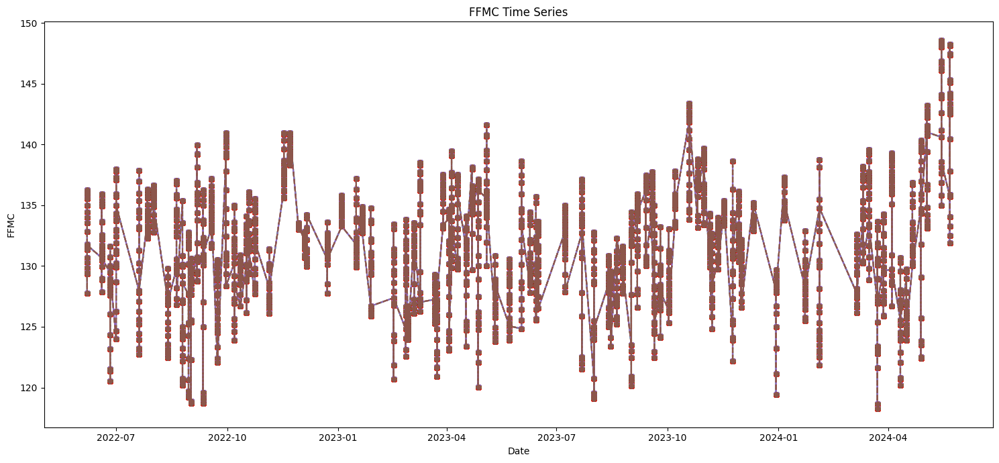

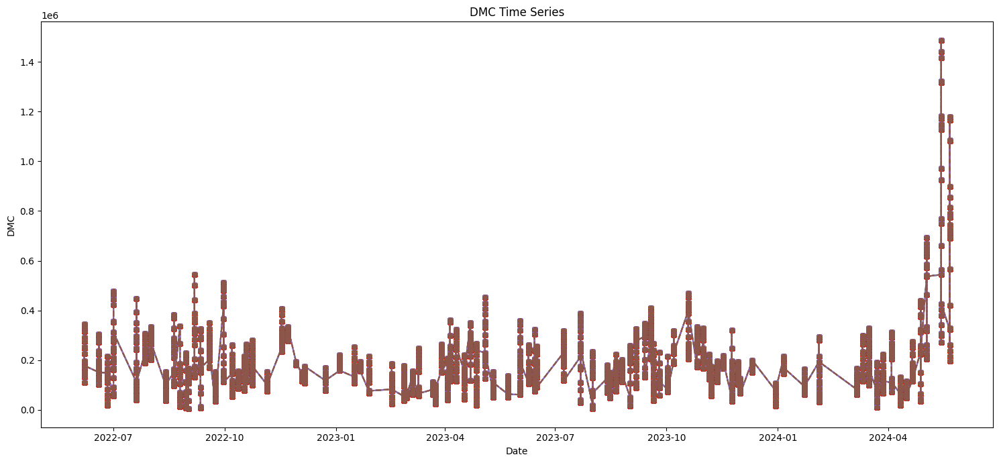

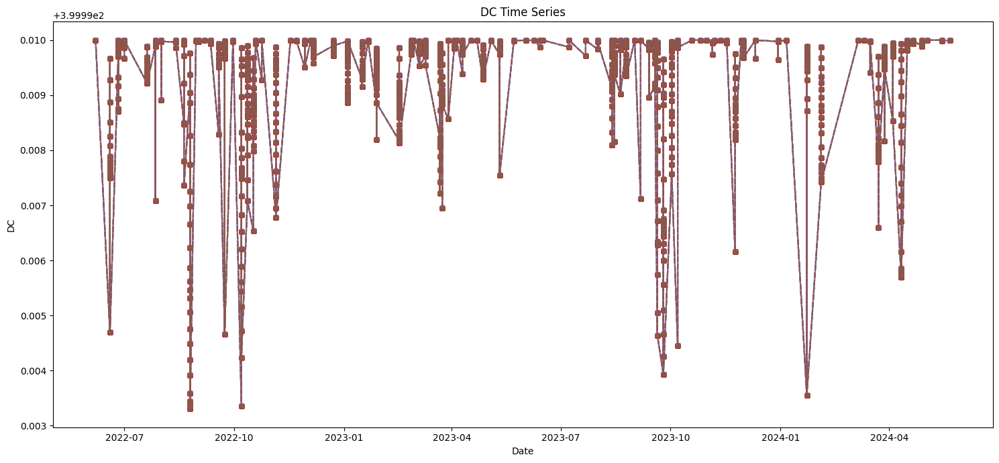

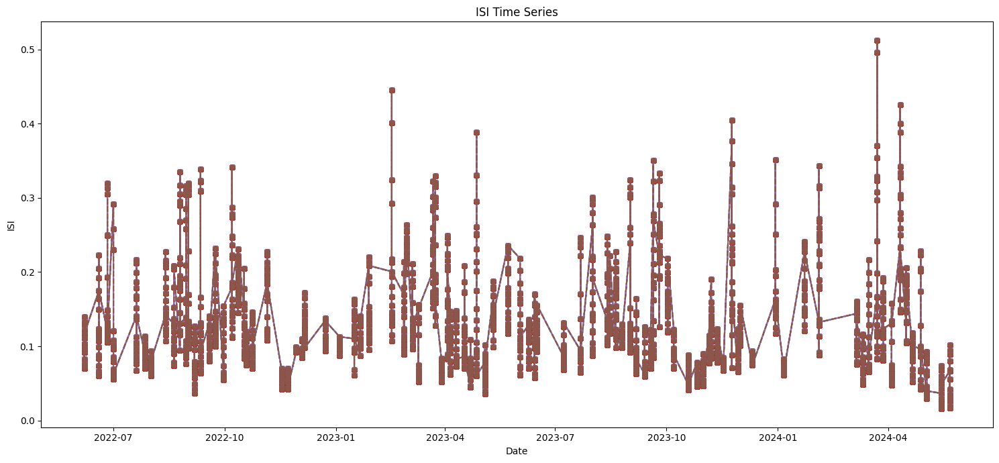

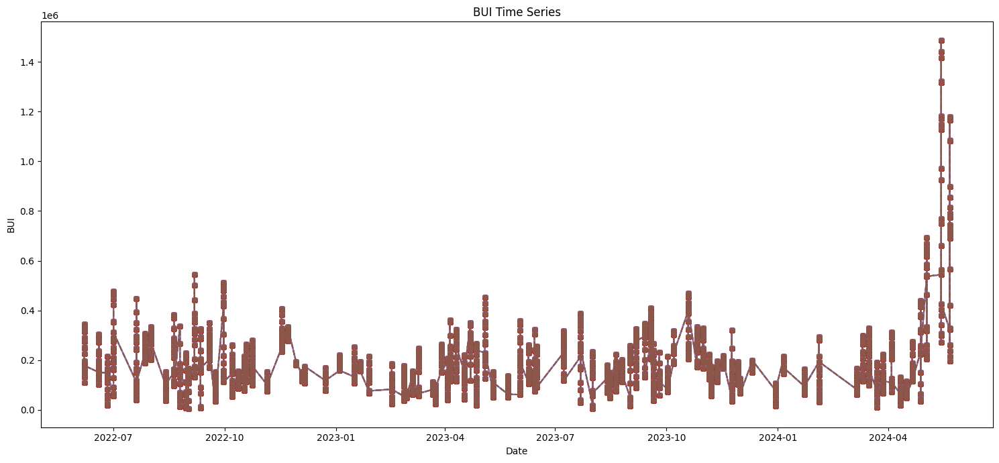

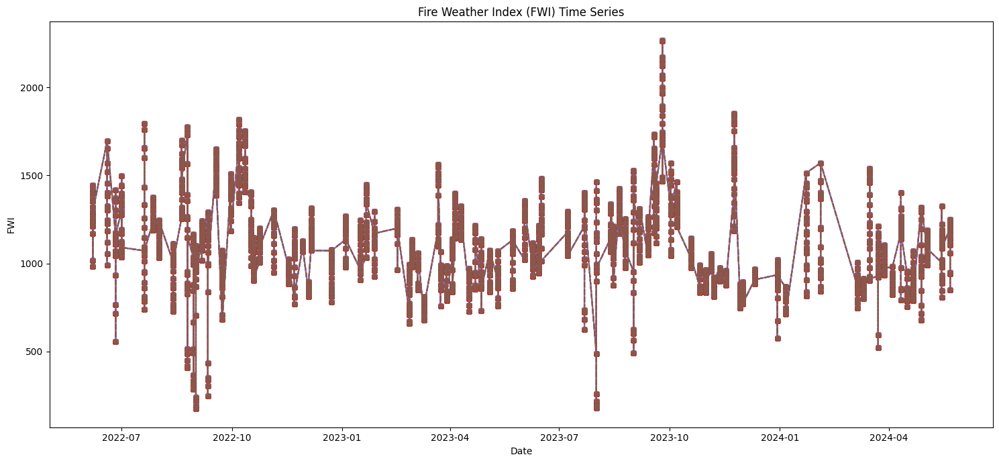

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Merge indices_df with data_df
combined_df = pd.merge(merged_df, data_df, on='Date', how='left')

# Merge the resulting DataFrame with era5_wind_df
combined_df = pd.merge(combined_df, era5_wind_df, on='Date', how='left')


# Simplified formulas for the sake of this example
def calculate_FFMC(T, RH, wind, rain):
    mo = 147.2 * (101.0 - 85.0) / (59.5 + 85.0)
    rf = rain - 0.5
    if mo > 0 and rf > 0:
        mo = mo + 42.5 * rf * np.exp(-100.0 / (251.0 - mo)) * (1.0 - np.exp(-6.93 / rf))
    ed = 0.942 * (RH ** 0.679) + 11.0 * np.exp((RH - 100.0) / 10.0) + 0.18 * (21.1 - T) * (1.0 - 1.0 / np.exp(0.115 * RH))
    ew = 0.618 * (RH ** 0.753) + 10.0 * np.exp((RH - 100.0) / 10.0) + 0.18 * (21.1 - T) * (1.0 - 1.0 / np.exp(0.115 * RH))
    if mo < ed:
        mo = ed - (ed - mo) / 10.0
    elif mo > ew:
        mo = ew + (mo - ew) / 10.0
    else:
        mo = mo
    FFMC = 59.5 * (250.0 - mo) / (147.2 + mo)
    return FFMC

def calculate_DMC(T, RH, rain, month):
    if rain > 1.5:
        rain = rain - 1.5
    else:
        rain = 0
    el = (0.36 * (T + 2.8) + np.exp((T + 2.8) / 17.27)) / 100
    DMC = el * (1.0 + (T - 4.5) / 50) * ((100 - RH) / 100) + rain
    return DMC

def calculate_DC(T, rain, month):
    if month > 5 and month < 9:
        k = 0.0005
    else:
        k = 0.0004
    DC = 400.0 * np.exp(-k * rain)
    return DC

def calculate_ISI(FFMC, wind):
    ISI = 0.208 * np.exp(0.05039 * wind) * (91.9 * np.exp(-0.1386 * FFMC) * (1.0 + FFMC ** 5.31 / 493000.0))
    return ISI

def calculate_BUI(DMC, DC):
    if DMC <= 0.4 * DC:
        BUI = 0.8 * DMC * DC / (DMC + 0.4 * DC)
    else:
        BUI = DMC - (1.0 - 0.8 * DC / (DMC + 0.4 * DC))
    return BUI

def calculate_FWI(ISI, BUI):
    if BUI <= 80.0:
        FWI = ISI * (0.1 * BUI)
    else:
        FWI = ISI * (0.626 * BUI ** 0.809 + 2.0)
    return FWI

# Ensure 'combined_df' contains 'RelativeHumidity' and 'WindSpeed' columns
# Add FFMC, DMC, DC, ISI, BUI, and FWI to the combined DataFrame
combined_df['FFMC'] = combined_df.apply(lambda row: calculate_FFMC(row['Temperature'], row['RelativeHumidity'], row['WindSpeed'], row['Precipitation_x']), axis=1)
combined_df['DMC'] = combined_df.apply(lambda row: calculate_DMC(row['Temperature'], row['RelativeHumidity'], row['Precipitation_x'], row['Date'].month), axis=1)
combined_df['DC'] = combined_df.apply(lambda row: calculate_DC(row['Temperature'], row['Precipitation_x'], row['Date'].month), axis=1)
combined_df['ISI'] = combined_df.apply(lambda row: calculate_ISI(row['FFMC'], row['WindSpeed']), axis=1)
combined_df['BUI'] = combined_df.apply(lambda row: calculate_BUI(row['DMC'], row['DC']), axis=1)
combined_df['FWI'] = combined_df.apply(lambda row: calculate_FWI(row['ISI'], row['BUI']), axis=1)

# Save the combined DataFrame with FWI to a CSV file
combined_df.to_csv('combined_timeseries_with_FWI.csv', index=False)

# Plot the components of FWI
components_to_plot = ['FFMC', 'DMC', 'DC', 'ISI', 'BUI']
for component in components_to_plot:
    fig, ax = plt.subplots(figsize=(15, 7))
    for i, shp in enumerate(shapefiles):
        shp_indices = combined_df[combined_df['Shapefile'] == shp]
        simple_name = shapefile_names[i]
        sorted_shp_indices = shp_indices.sort_values(by='Date')
        ax.plot(sorted_shp_indices['Date'], sorted_shp_indices[component], linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    ax.set_title(f'{component} Time Series')
    ax.set_ylabel(component)
    ax.set_xlabel('Date')
    plt.tight_layout()
    plt.savefig(os.path.join(plot_directory, f'{component}_Time_Series.png'))
    plt.show()

# Plot FWI time series for all shapefiles
fig, ax = plt.subplots(figsize=(15, 7))
for i, shp in enumerate(shapefiles):
    shp_indices = combined_df[combined_df['Shapefile'] == shp]
    simple_name = shapefile_names[i]
    sorted_shp_indices = shp_indices.sort_values(by='Date')
    ax.plot(sorted_shp_indices['Date'], sorted_shp_indices['FWI'], linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
ax.set_title('Fire Weather Index (FWI) Time Series')
ax.set_ylabel('FWI')
ax.set_xlabel('Date')
plt.tight_layout()
plt.savefig(os.path.join(plot_directory, 'FWI_Time_Series_All_Shapefiles.png'))
plt.show()


In [25]:
import pandas as pd

# Load the dataset
data_path = 'combined_timeseries_with_FWI.csv'
data = pd.read_csv(data_path)

# Convert 'Date' column to datetime
data['Date'] = pd.to_datetime(data['Date'])

# Display the dataset to ensure it has loaded correctly
print(data.head())


       NDVI      NDWI      GCI             Shapefile       Date  Backscatter  \
0  0.551246  0.316113  1.89259  AgriculturalLand.shp 2022-06-07   -11.674338   
1  0.551246  0.316113  1.89259  AgriculturalLand.shp 2022-06-07   -11.674338   
2  0.551246  0.316113  1.89259  AgriculturalLand.shp 2022-06-07   -11.674338   
3  0.551246  0.316113  1.89259  AgriculturalLand.shp 2022-06-07   -11.674338   
4  0.551246  0.316113  1.89259  AgriculturalLand.shp 2022-06-07   -11.674338   

           Shapefile_S1  Temperature  DewpointTemperature  Precipitation_x  \
0  AgriculturalLand.shp   284.570206           281.366135     4.351138e-07   
1  AgriculturalLand.shp   284.570206           281.366135     4.351138e-07   
2  AgriculturalLand.shp   284.570206           281.366135     4.351138e-07   
3  AgriculturalLand.shp   284.570206           281.366135     4.351138e-07   
4  AgriculturalLand.shp   284.570206           281.366135     4.351138e-07   

   ...  RelativeHumidity    u_wind    v_wind  Prec

In [43]:
data

,NDVI,NDWI,GCI,Shapefile,Date,Backscatter,Shapefile_S1,Temperature,DewpointTemperature,Precipitation_x,...,RelativeHumidity,u_wind,v_wind,Precipitation_y,FFMC,DMC,DC,ISI,BUI,FWI
0,0.551246,0.316113,1.892590,AgriculturalLand.shp,2022-06-07,-11.674338,AgriculturalLand.shp,284.570206,281.366135,4.351138e-07,...,83.979645,-1.473068,-6.808395,4.351138e-07,131.708542,178199.329817,400.0,0.116995,178198.331611,1296.580254
1,0.551246,0.316113,1.892590,AgriculturalLand.shp,2022-06-07,-11.674338,AgriculturalLand.shp,284.570206,281.366135,4.351138e-07,...,83.979645,-1.769180,-6.281219,0.000000e+00,131.708542,178199.329817,400.0,0.116995,178198.331611,1296.580254
2,0.551246,0.316113,1.892590,AgriculturalLand.shp,2022-06-07,-11.674338,AgriculturalLand.shp,284.570206,281.366135,4.351138e-07,...,83.979645,-1.823593,-5.732651,0.000000e+00,131.708542,178199.329817,400.0,0.116995,178198.331611,1296.580254
3,0.551246,0.316113,1.892590,AgriculturalLand.shp,2022-06-07,-11.674338,AgriculturalLand.shp,284.570206,281.366135,4.351138e-07,...,83.979645,-1.672913,-5.767273,0.000000e+00,131.708542,178199.329817,400.0,0.116995,178198.331611,1296.580254
4,0.551246,0.316113,1.892590,AgriculturalLand.shp,2022-06-07,-11.674338,AgriculturalLand.shp,284.570206,281.366135,4.351138e-07,...,83.979645,-1.585403,-5.961914,0.000000e+00,131.708542,178199.329817,400.0,0.116995,178198.331611,1296.580254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4831483,0.380017,0.235890,0.925874,SpruceTrees.shp,2024-05-22,-9.487559,SpruceTrees.shp,290.674927,280.083099,8.583069e-07,...,47.040863,-2.412735,-4.314457,0.000000e+00,145.107904,854378.936468,400.0,0.028929,854377.936843,1139.308455
4831484,0.380017,0.235890,0.925874,SpruceTrees.shp,2024-05-22,-9.487559,SpruceTrees.shp,290.674927,280.083099,8.583069e-07,...,47.040863,-3.804489,-3.114246,0.000000e+00,145.107904,854378.936468,400.0,0.028929,854377.936843,1139.308455
4831485,0.380017,0.235890,0.925874,SpruceTrees.shp,2024-05-22,-9.487559,SpruceTrees.shp,290.674927,280.083099,8.583069e-07,...,47.040863,-5.012817,-1.197191,8.583069e-07,145.107904,854378.936468,400.0,0.028929,854377.936843,1139.308455
4831486,0.380017,0.235890,0.925874,SpruceTrees.shp,2024-05-22,-9.487559,SpruceTrees.shp,290.674927,280.083099,8.583069e-07,...,47.040863,-5.607635,0.765497,8.583069e-07,145.107904,854378.936468,400.0,0.028929,854377.936843,1139.308455


In [76]:
import pandas as pd



# Group by 'Date' and 'Shapefile' and then calculate the mean of the specified columns
group_columns = ['Date', 'Shapefile']

# Calculate the mean for the specified columns for each group
mean_df = combined_df.groupby(group_columns, as_index=False).agg({
    'WindSpeed': 'mean',
    'RelativeHumidity': 'mean',
    'Precipitation_x': 'mean',
    'Precipitation_y': 'mean',
    'NDVI': 'mean',
    'NDWI': 'mean',
    'GCI': 'mean',
    'Backscatter': 'mean',
    'Temperature': 'mean',
    'DewpointTemperature': 'mean',
    'u_wind': 'mean',
    'v_wind': 'mean',
    'FFMC': 'mean',
    'DMC': 'mean',
    'DC': 'mean',
    'ISI': 'mean',
    'BUI': 'mean',
    'FWI': 'mean'
})

# Save the averaged DataFrame to a new CSV file
mean_df.to_csv('averaged_combined_timeseries.csv', index=False)

# Print the head of the averaged DataFrame
print(mean_df.head())


         Date             Shapefile  WindSpeed  RelativeHumidity  \
0  2022-06-07  AgriculturalLand.shp   5.588464          81.90464   
1  2022-06-07    DecidiousTrees.shp   5.588464          81.90464   
2  2022-06-07  Moors&HealthLand.shp   5.588464          81.90464   
3  2022-06-07          PeatBogs.shp   5.588464          81.90464   
4  2022-06-07         PineTrees.shp   5.588464          81.90464   

   Precipitation_x  Precipitation_y      NDVI      NDWI       GCI  \
0         0.000003         0.000003  0.551246  0.316113  1.892590   
1         0.000003         0.000003  0.518549  0.272388  1.542262   
2         0.000003         0.000003  0.435696  0.196818  1.187913   
3         0.000003         0.000003  0.096769  0.109143  0.160995   
4         0.000003         0.000003  0.432715  0.238482  1.095787   

   Backscatter  Temperature  DewpointTemperature    u_wind    v_wind  \
0   -10.874827   286.858525           283.239453 -1.215087 -5.238526   
1   -10.874827   286.858525     

Epoch 1/50
2/2 [==============================] - 2s 241ms/step - loss: 325835.8750 - val_loss: 297057.6562
Epoch 2/50
2/2 [==============================] - 0s 40ms/step - loss: 325538.0938 - val_loss: 296839.5312
Epoch 3/50
2/2 [==============================] - 0s 43ms/step - loss: 325352.9062 - val_loss: 296620.6250
Epoch 4/50
2/2 [==============================] - 0s 40ms/step - loss: 325040.2500 - val_loss: 296395.0312
Epoch 5/50
2/2 [==============================] - 0s 39ms/step - loss: 324800.0000 - val_loss: 296166.4688
Epoch 6/50
2/2 [==============================] - 0s 41ms/step - loss: 324501.5312 - val_loss: 295930.5312
Epoch 7/50
2/2 [==============================] - 0s 39ms/step - loss: 324220.8125 - val_loss: 295682.7812
Epoch 8/50
2/2 [==============================] - 0s 38ms/step - loss: 323991.9688 - val_loss: 295417.7500
Epoch 9/50
2/2 [==============================] - 0s 43ms/step - loss: 323661.8750 - val_loss: 295131.4062
Epoch 10/50
2/2 [===================

2/2 [==============================] - 0s 38ms/step - loss: 268027.6875 - val_loss: 237378.7031
Epoch 50/50
2/2 [==============================] - 0s 4ms/step
TFT for Moors&HealthLand.shp - FWI RMSE: 971.1916882855538, NDVI RMSE: 0.3983834434006893, NDWI RMSE: 0.25083571941303034, GCI RMSE: 0.6786449810359109
Epoch 1/50
2/2 [==============================] - 2s 250ms/step - loss: 326810.0938 - val_loss: 298009.4688
Epoch 2/50
2/2 [==============================] - 0s 53ms/step - loss: 326530.9062 - val_loss: 297765.5312
Epoch 3/50
2/2 [==============================] - 0s 44ms/step - loss: 326284.0312 - val_loss: 297530.3750
Epoch 4/50
2/2 [==============================] - 0s 34ms/step - loss: 326047.7500 - val_loss: 297303.9062
Epoch 5/50
2/2 [==============================] - 0s 62ms/step - loss: 325818.5312 - val_loss: 297082.7812
Epoch 6/50
2/2 [==============================] - 0s 38ms/step - loss: 325537.5312 - val_loss: 296859.6562
Epoch 7/50
2/2 [==============================

2/2 [==============================] - 0s 47ms/step - loss: 280599.9688 - val_loss: 250511.6406
Epoch 46/50
2/2 [==============================] - 0s 43ms/step - loss: 278274.1562 - val_loss: 248146.2656
Epoch 47/50
2/2 [==============================] - 0s 36ms/step - loss: 276969.2812 - val_loss: 245725.0469
Epoch 48/50
2/2 [==============================] - 0s 38ms/step - loss: 272947.1875 - val_loss: 243243.9844
Epoch 49/50
2/2 [==============================] - 0s 48ms/step - loss: 270584.4688 - val_loss: 240704.2500
Epoch 50/50
2/2 [==============================] - 0s 4ms/step
TFT for SpruceTrees.shp - FWI RMSE: 977.9499078736541, NDVI RMSE: 0.8701938328184318, NDWI RMSE: 0.15569397636375973, GCI RMSE: 0.38042564838569104
Epoch 1/50
12/12 [==============================] - 2s 28ms/step - loss: 1232745.1250 - val_loss: 1308013.2500
Epoch 2/50
12/12 [==============================] - 0s 8ms/step - loss: 1229440.1250 - val_loss: 1303962.3750
Epoch 3/50
12/12 [======================

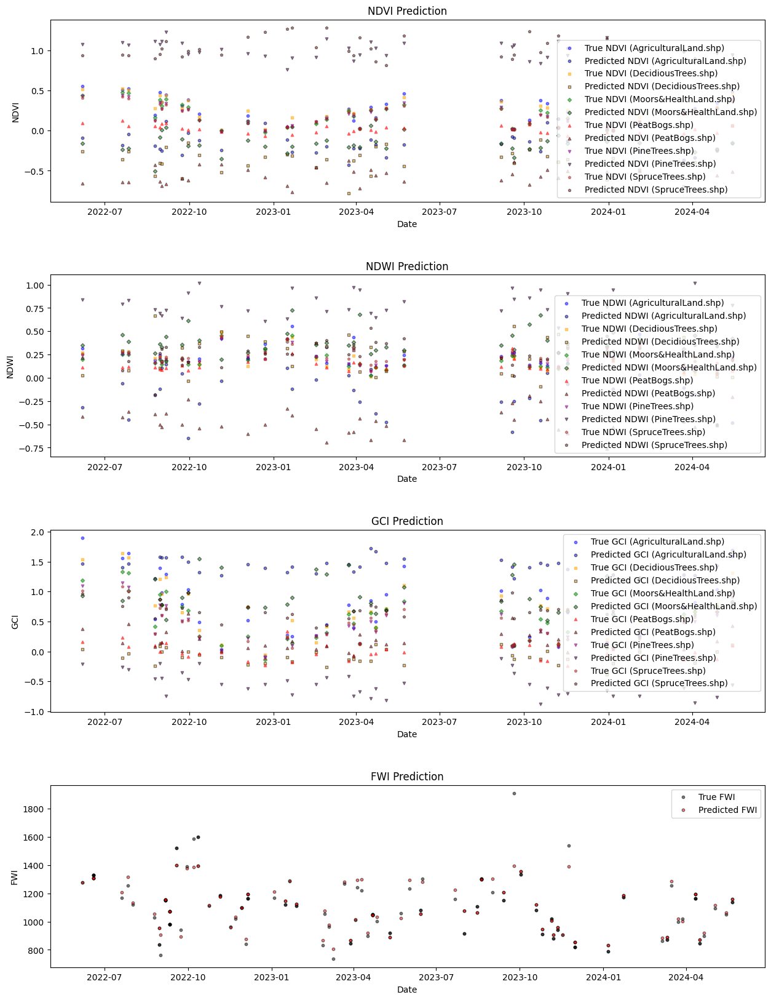

In [90]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LayerNormalization, MultiHeadAttention, Dropout, Layer, Conv1D, Flatten, Add
import matplotlib.pyplot as plt

# Read the averaged data
averaged_file_path = 'averaged_combined_timeseries.csv'
averaged_df = pd.read_csv(averaged_file_path)

# Convert the Date column to datetime
averaged_df['Date'] = pd.to_datetime(averaged_df['Date'])

# Function to build the TFT model
class AddAndNorm(Layer):
    def __init__(self, **kwargs):
        super(AddAndNorm, self).__init__(**kwargs)
        self.norm = LayerNormalization()

    def call(self, inputs, sublayer):
        return self.norm(Add()([inputs, sublayer]))

def build_tft(input_shape):
    inputs = Input(shape=input_shape)

    # Conv1D layer to capture spatial relationships
    x = Conv1D(filters=64, kernel_size=1, activation='relu')(inputs)

    # Multi-Head Attention
    attn_output = MultiHeadAttention(num_heads=4, key_dim=2)(x, x)
    attn_output = Dropout(0.1)(attn_output)
    x = AddAndNorm()(inputs=x, sublayer=attn_output)

    # Flatten layer
    x = Flatten()(x)

    # Fully connected layers
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.1)(x)
    outputs = Dense(len(targets))(x)  # Output should match the number of target variables

    # Build and compile model
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mean_squared_error')

    return model

# Separate the vegetation types
vegetation_types = averaged_df['Shapefile'].unique()

# Define features and targets
features = ['Backscatter', 'Temperature', 'Precipitation_x', 'WindSpeed', 'RelativeHumidity']
targets = ['FWI', 'NDVI', 'NDWI', 'GCI']

# Prepare the plots
fig, axes = plt.subplots(4, 1, figsize=(15, 20))
plt.subplots_adjust(hspace=0.4)

colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']
markers = ['o', 's', 'D', '^', 'v', 'p']
color_marker_dict = dict(zip(vegetation_types, zip(colors, markers)))

# Iterate over each vegetation type
for veg_type in vegetation_types:
    veg_data = averaged_df[averaged_df['Shapefile'] == veg_type]

    # Train-test split
    X = veg_data[features]
    y = veg_data[targets]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

    # Standardize the data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Reshape for TFT [samples, time steps, features]
    X_train_tft = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
    X_test_tft = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

    tft_model = build_tft(X_train_tft.shape[1:])
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    tft_model.fit(X_train_tft, y_train, epochs=50, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

    # Predict using TFT
    tft_predictions = tft_model.predict(X_test_tft)

    # Calculate RMSE for TFT
    tft_rmse_fwi = np.sqrt(mean_squared_error(y_test['FWI'], tft_predictions[:, 0]))
    tft_rmse_ndvi = np.sqrt(mean_squared_error(y_test['NDVI'], tft_predictions[:, 1]))
    tft_rmse_ndwi = np.sqrt(mean_squared_error(y_test['NDWI'], tft_predictions[:, 2]))
    tft_rmse_gci = np.sqrt(mean_squared_error(y_test['GCI'], tft_predictions[:, 3]))
    print(f"TFT for {veg_type} - FWI RMSE: {tft_rmse_fwi}, NDVI RMSE: {tft_rmse_ndvi}, NDWI RMSE: {tft_rmse_ndwi}, GCI RMSE: {tft_rmse_gci}")

    # Plotting the results with scatter plots
    color, marker = color_marker_dict[veg_type]

    # Use the index of y_test to get the correct dates from the original DataFrame
    test_dates = veg_data.loc[y_test.index, 'Date']

    # Plot NDVI
    axes[0].scatter(test_dates, y_test['NDVI'], label=f'True NDVI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[0].scatter(test_dates, tft_predictions[:, 1], label=f'Predicted NDVI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

    # Plot NDWI
    axes[1].scatter(test_dates, y_test['NDWI'], label=f'True NDWI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[1].scatter(test_dates, tft_predictions[:, 2], label=f'Predicted NDWI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

    # Plot GCI
    axes[2].scatter(test_dates, y_test['GCI'], label=f'True GCI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[2].scatter(test_dates, tft_predictions[:, 3], label=f'Predicted GCI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

# Plot FWI (independent of vegetation type)
X = averaged_df[features]
y = averaged_df['FWI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape for TFT [samples, time steps, features]
X_train_tft = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_tft = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

tft_model = build_tft(X_train_tft.shape[1:])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

tft_model.fit(X_train_tft, y_train, epochs=50, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

# Predict using TFT
tft_predictions = tft_model.predict(X_test_tft)

# Calculate RMSE for TFT
tft_rmse_fwi = np.sqrt(mean_squared_error(y_test, tft_predictions[:, 0]))
print(f"TFT - FWI RMSE: {tft_rmse_fwi}")

# Use the index of y_test to get the correct dates from the original DataFrame
test_dates = averaged_df.loc[y_test.index, 'Date']

# Plotting the results with scatter plots
axes[3].scatter(test_dates, y_test, label='True FWI', color='black', alpha=0.5, s=10, marker='o')
axes[3].scatter(test_dates, tft_predictions[:, 0], label='Predicted FWI', color='red', alpha=0.5, s=10, edgecolor='k', marker='o')

# Set titles and labels
axes[0].set_title('NDVI Prediction')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('NDVI')
axes[0].legend()

axes[1].set_title('NDWI Prediction')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('NDWI')
axes[1].legend()

axes[2].set_title('GCI Prediction')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('GCI')
axes[2].legend()

axes[3].set_title('FWI Prediction')
axes[3].set_xlabel('Date')
axes[3].set_ylabel('FWI')
axes[3].legend()



plt.show()


In [95]:
# Print the head of the averaged DataFrame
print(mean_df.head())

         Date             Shapefile  WindSpeed  RelativeHumidity  \
0  2022-06-07  AgriculturalLand.shp   5.588464          81.90464   
1  2022-06-07    DecidiousTrees.shp   5.588464          81.90464   
2  2022-06-07  Moors&HealthLand.shp   5.588464          81.90464   
3  2022-06-07          PeatBogs.shp   5.588464          81.90464   
4  2022-06-07         PineTrees.shp   5.588464          81.90464   

   Precipitation_x  Precipitation_y      NDVI      NDWI       GCI  \
0         0.000003         0.000003  0.551246  0.316113  1.892590   
1         0.000003         0.000003  0.518549  0.272388  1.542262   
2         0.000003         0.000003  0.435696  0.196818  1.187913   
3         0.000003         0.000003  0.096769  0.109143  0.160995   
4         0.000003         0.000003  0.432715  0.238482  1.095787   

   Backscatter  Temperature  DewpointTemperature    u_wind    v_wind  \
0   -10.874827   286.858525           283.239453 -1.215087 -5.238526   
1   -10.874827   286.858525     

Epoch 1/50
15/15 [==============================] - 2s 34ms/step - loss: 0.1603 - val_loss: 0.0602
Epoch 2/50
15/15 [==============================] - 0s 16ms/step - loss: 0.0654 - val_loss: 0.0581
Epoch 3/50
15/15 [==============================] - 0s 24ms/step - loss: 0.0531 - val_loss: 0.0487
Epoch 4/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0464 - val_loss: 0.0475
Epoch 5/50
15/15 [==============================] - 0s 16ms/step - loss: 0.0416 - val_loss: 0.0432
Epoch 6/50
15/15 [==============================] - 0s 23ms/step - loss: 0.0395 - val_loss: 0.0411
Epoch 7/50
15/15 [==============================] - 0s 17ms/step - loss: 0.0365 - val_loss: 0.0385
Epoch 8/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0343 - val_loss: 0.0364
Epoch 9/50
15/15 [==============================] - 0s 11ms/step - loss: 0.0319 - val_loss: 0.0349
Epoch 10/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0305 - val_loss: 0.0325
Epoch 11/

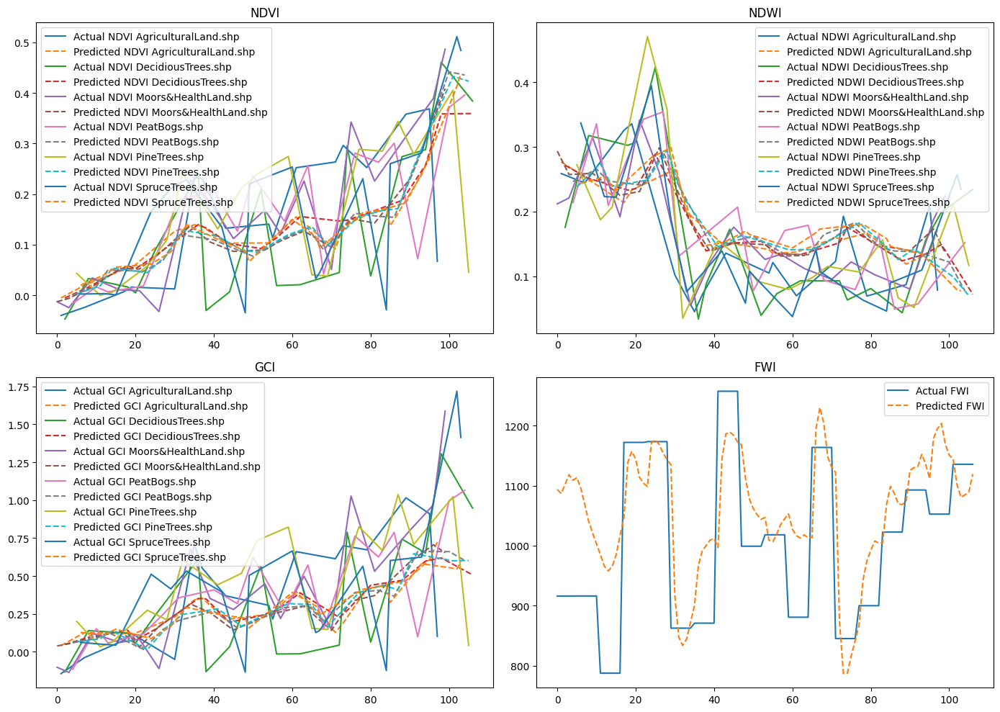

In [102]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Correctly adjust indices for plotting
start_idx = len(train_data) - sequence_length

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][start_idx:len(actual_ndvi) + start_idx].values == shapefile)[0]
    plt.plot(shapefile_indices, actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(shapefile_indices, predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][start_idx:len(actual_ndwi) + start_idx].values == shapefile)[0]
    plt.plot(shapefile_indices, actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(shapefile_indices, predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][start_idx:len(actual_gci) + start_idx].values == shapefile)[0]
    plt.plot(shapefile_indices, actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(shapefile_indices, predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(actual_fwi, label='Actual FWI')
plt.plot(predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()


Epoch 1/50
15/15 [==============================] - 2s 34ms/step - loss: 0.1414 - val_loss: 0.0662
Epoch 2/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0650 - val_loss: 0.0546
Epoch 3/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0502 - val_loss: 0.0466
Epoch 4/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0446 - val_loss: 0.0433
Epoch 5/50
15/15 [==============================] - 0s 12ms/step - loss: 0.0421 - val_loss: 0.0402
Epoch 6/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0385 - val_loss: 0.0403
Epoch 7/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0362 - val_loss: 0.0382
Epoch 8/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0341 - val_loss: 0.0361
Epoch 9/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0332 - val_loss: 0.0352
Epoch 10/50
15/15 [==============================] - 0s 10ms/step - loss: 0.0315 - val_loss: 0.0341
Epoch 11/

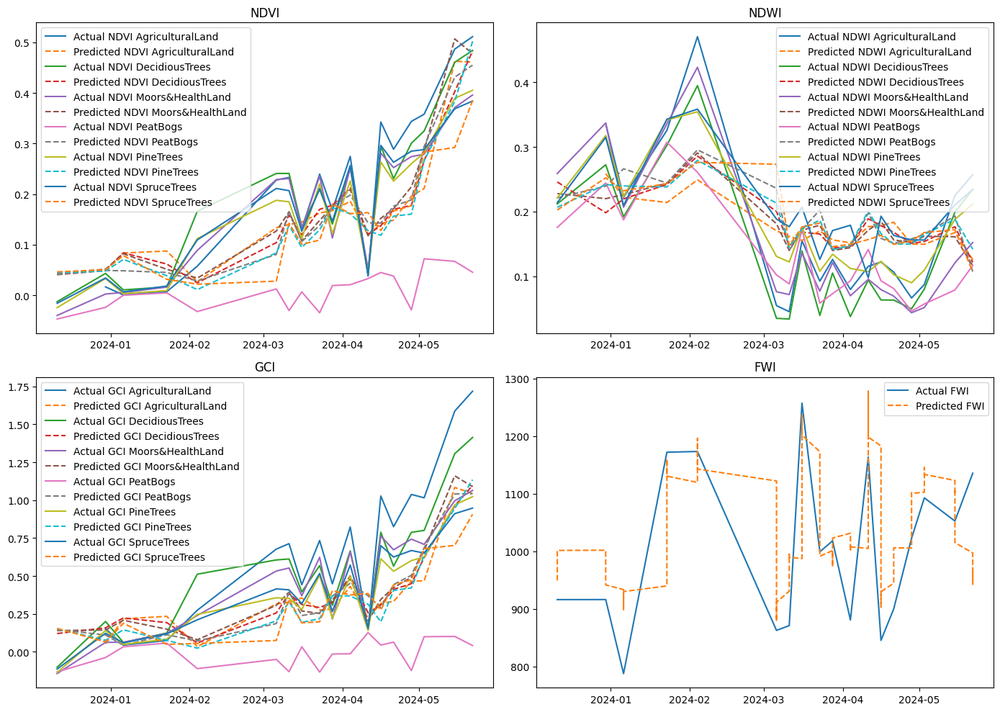

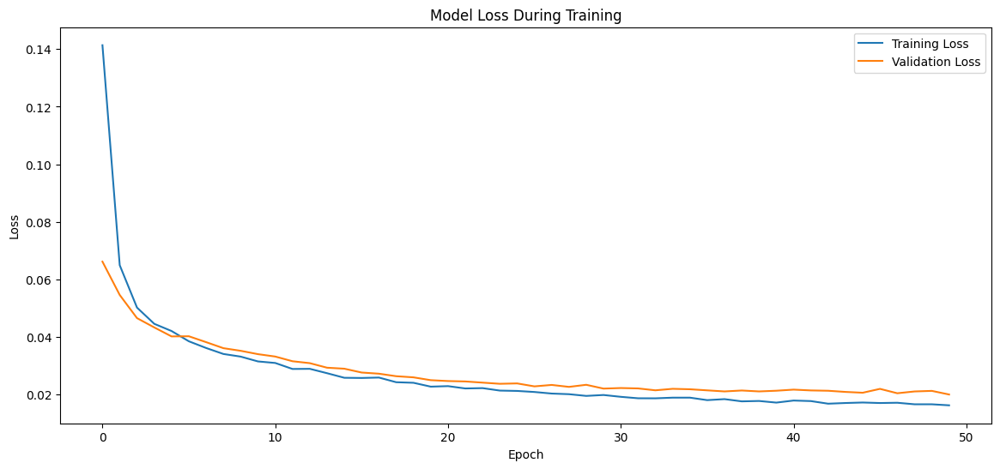

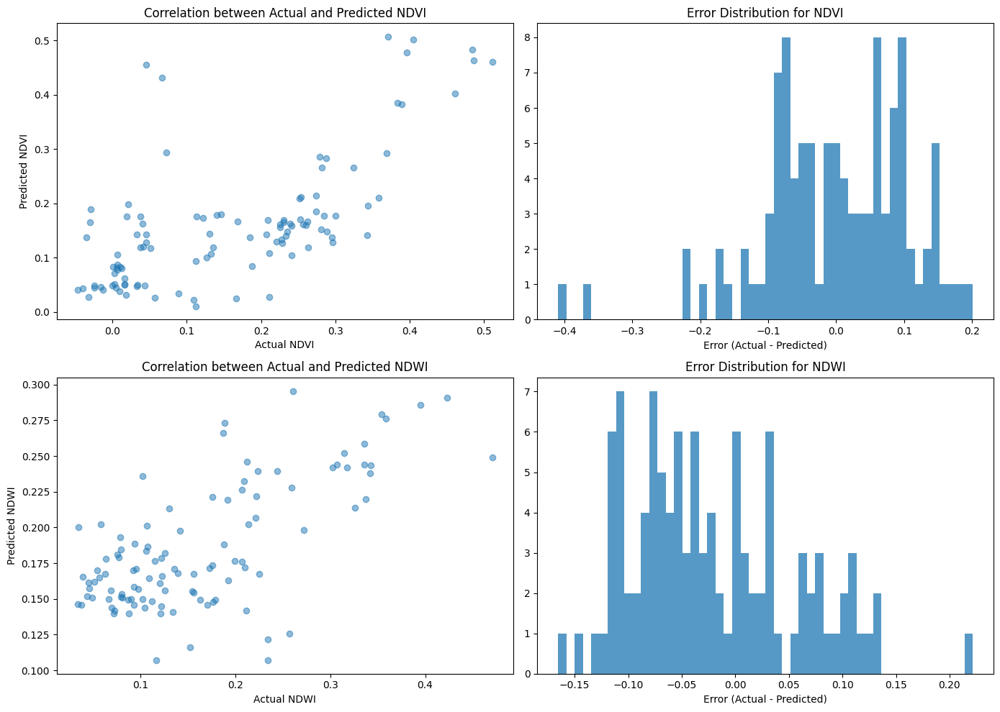

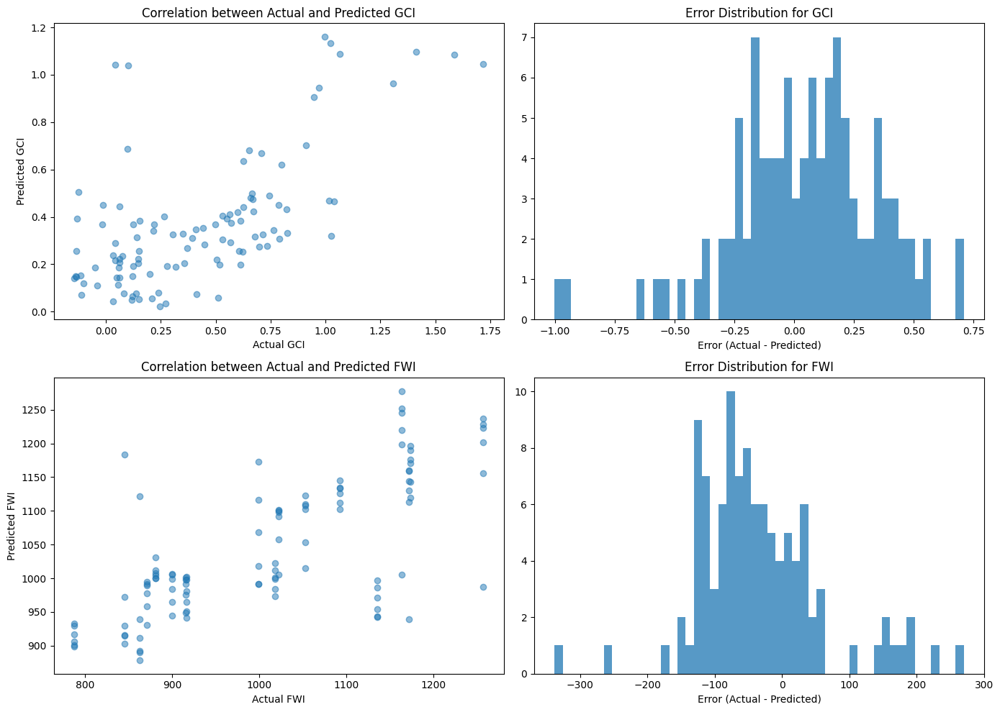

In [104]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Remove '.shp' from shapefile names
df['Shapefile'] = df['Shapefile'].str.replace('.shp', '')

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()
dates = df['Date'][train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


Epoch 1/50
15/15 [==============================] - 6s 119ms/step - loss: 0.1101 - val_loss: 0.0567
Epoch 2/50
15/15 [==============================] - 1s 44ms/step - loss: 0.0609 - val_loss: 0.0481
Epoch 3/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0502 - val_loss: 0.0450
Epoch 4/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0432 - val_loss: 0.0412
Epoch 5/50
15/15 [==============================] - 1s 59ms/step - loss: 0.0380 - val_loss: 0.0388
Epoch 6/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0369 - val_loss: 0.0376
Epoch 7/50
15/15 [==============================] - 1s 55ms/step - loss: 0.0344 - val_loss: 0.0371
Epoch 8/50
15/15 [==============================] - 1s 50ms/step - loss: 0.0315 - val_loss: 0.0332
Epoch 9/50
15/15 [==============================] - 1s 48ms/step - loss: 0.0302 - val_loss: 0.0322
Epoch 10/50
15/15 [==============================] - 1s 58ms/step - loss: 0.0292 - val_loss: 0.0312
Epoch 11

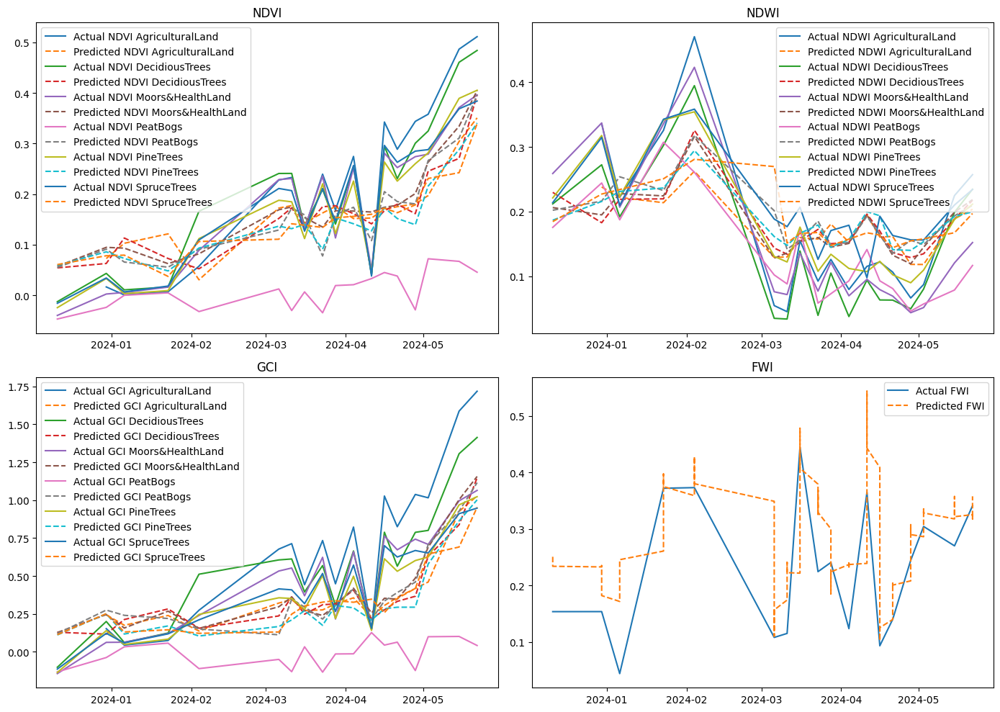

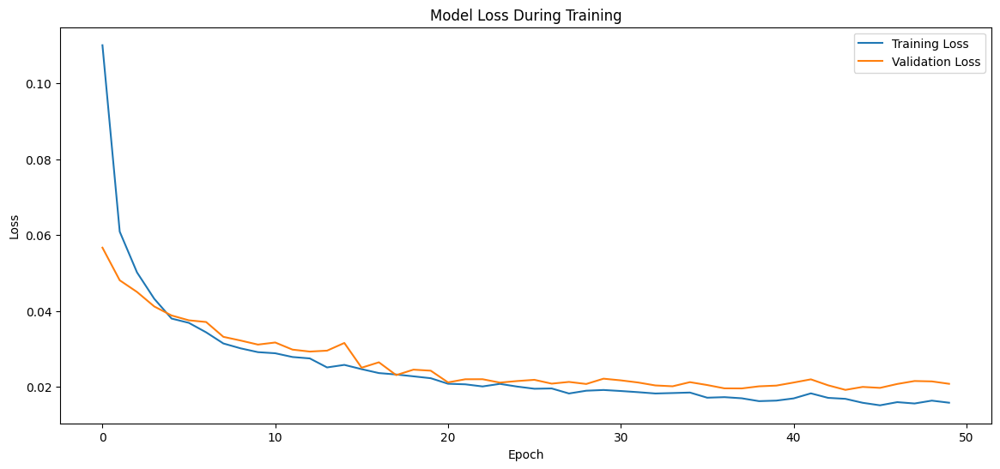

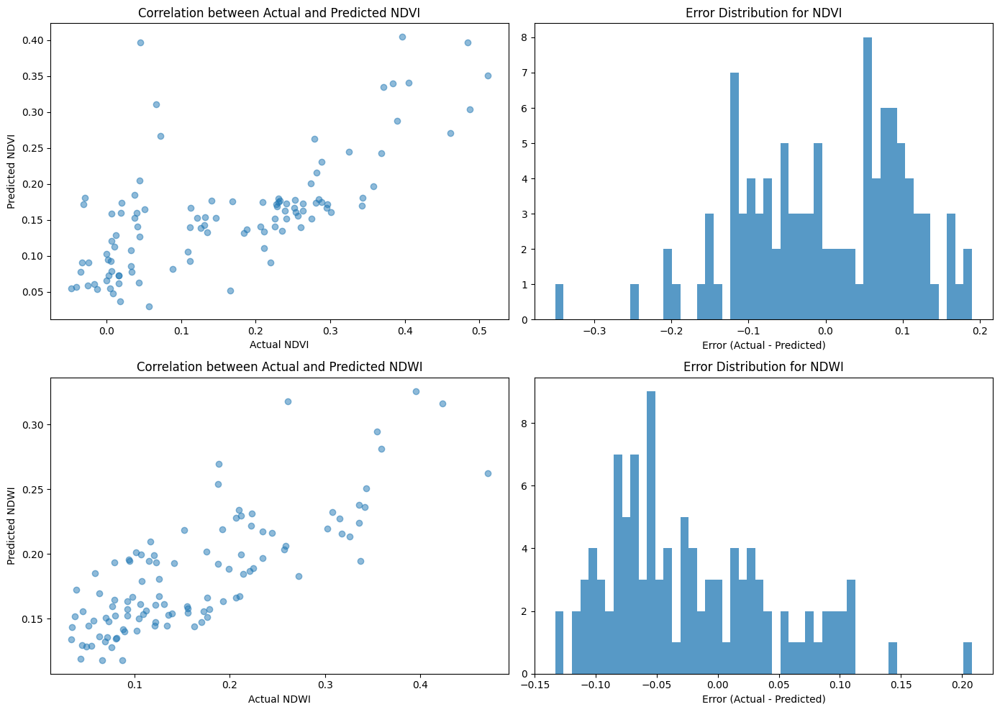

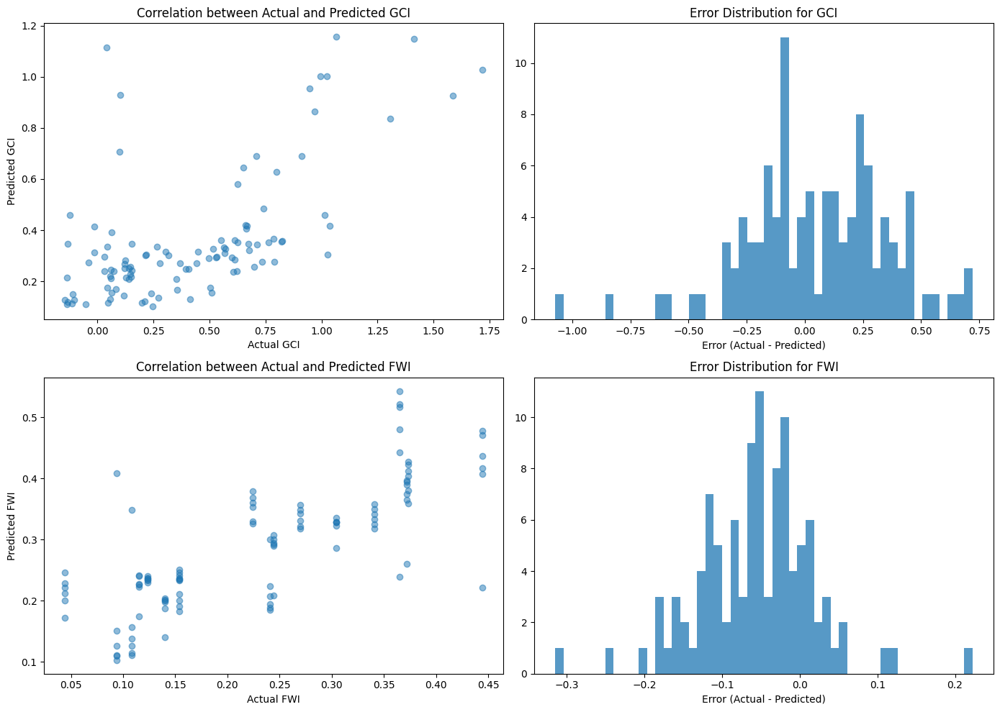

In [112]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')

# Separate FWI for scaling
fwi_scaler = MinMaxScaler()
df['FWI'] = fwi_scaler.fit_transform(df[['FWI']])

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Prepare data for TFT-like model
def create_sequences(data, sequence_length):
    xs, ys = [], []
    for i in range(len(data) - sequence_length):
        x = data[i:i + sequence_length]
        y = data[i + sequence_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

X_train, y_train = create_sequences(train_data, sequence_length)
X_test, y_test = create_sequences(test_data, sequence_length)

# Build the TFT-like model
def build_tft_model(input_shape):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.LSTM(128, return_sequences=True)(inputs)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.LSTM(128)(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    outputs = tf.keras.layers.Dense(features)(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model

input_shape = (X_train.shape[1], X_train.shape[2])
model = build_tft_model(input_shape)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=batch_size, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(y_test)

# Rescale the FWI values back to the original scale
#predictions[:, -1] = fwi_scaler.inverse_transform(predictions[:, -1].reshape(-1, 1)).flatten()
#actual[:, -1] = fwi_scaler.inverse_transform(actual[:, -1].reshape(-1, 1)).flatten()

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Remove '.shp' from shapefile names
df['Shapefile'] = df['Shapefile'].str.replace('.shp', '')

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()
dates = df['Date'][train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## TFT

Epoch 1/50
15/15 [==============================] - 6s 107ms/step - loss: 0.1114 - val_loss: 0.0562
Epoch 2/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0606 - val_loss: 0.0450
Epoch 3/50
15/15 [==============================] - 1s 55ms/step - loss: 0.0491 - val_loss: 0.0398
Epoch 4/50
15/15 [==============================] - 1s 47ms/step - loss: 0.0448 - val_loss: 0.0386
Epoch 5/50
15/15 [==============================] - 1s 53ms/step - loss: 0.0411 - val_loss: 0.0369
Epoch 6/50
15/15 [==============================] - 1s 53ms/step - loss: 0.0375 - val_loss: 0.0343
Epoch 7/50
15/15 [==============================] - 1s 57ms/step - loss: 0.0349 - val_loss: 0.0334
Epoch 8/50
15/15 [==============================] - 1s 43ms/step - loss: 0.0339 - val_loss: 0.0317
Epoch 9/50
15/15 [==============================] - 1s 47ms/step - loss: 0.0325 - val_loss: 0.0321
Epoch 10/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0305 - val_loss: 0.0297
Epoch 11

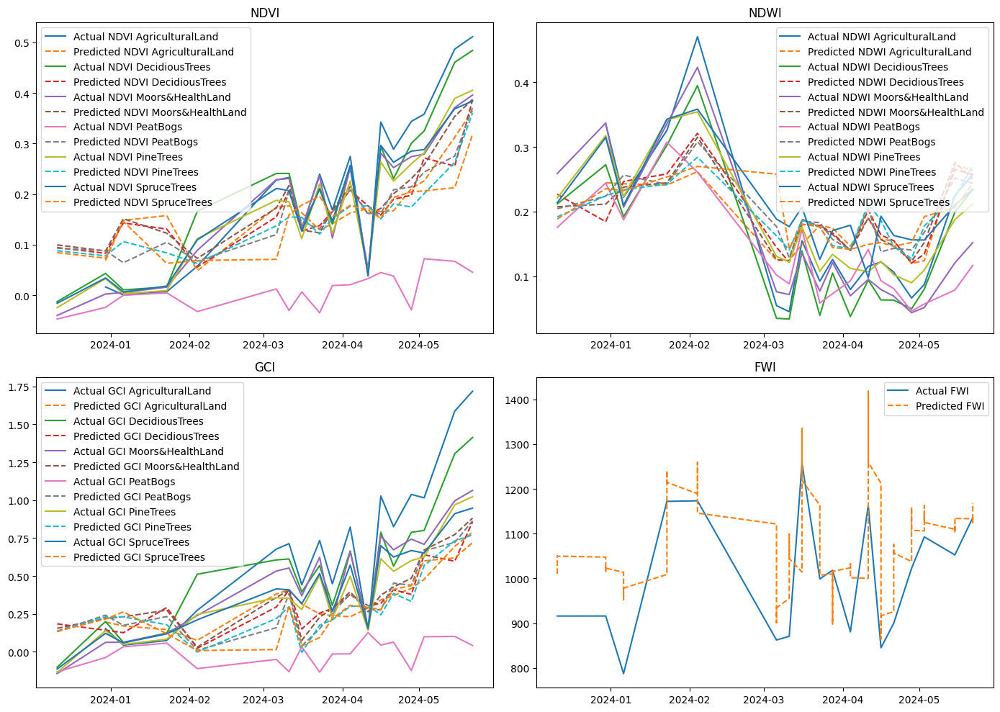

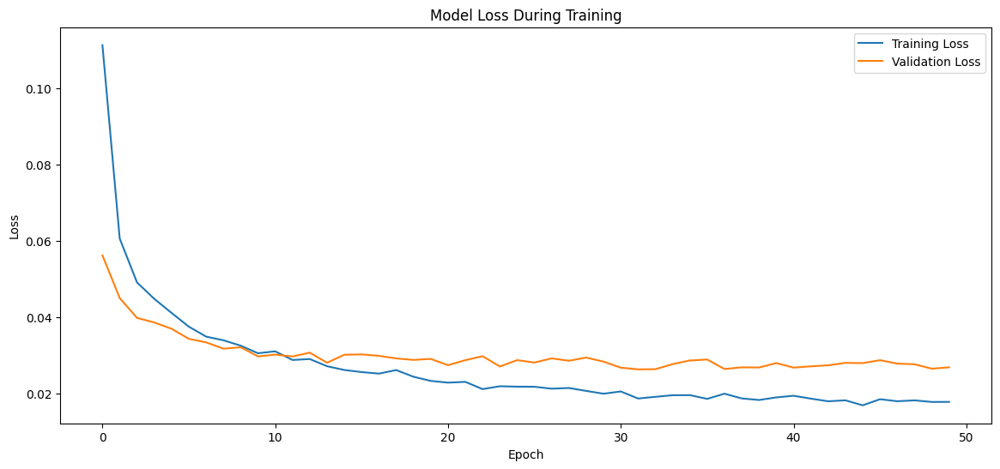

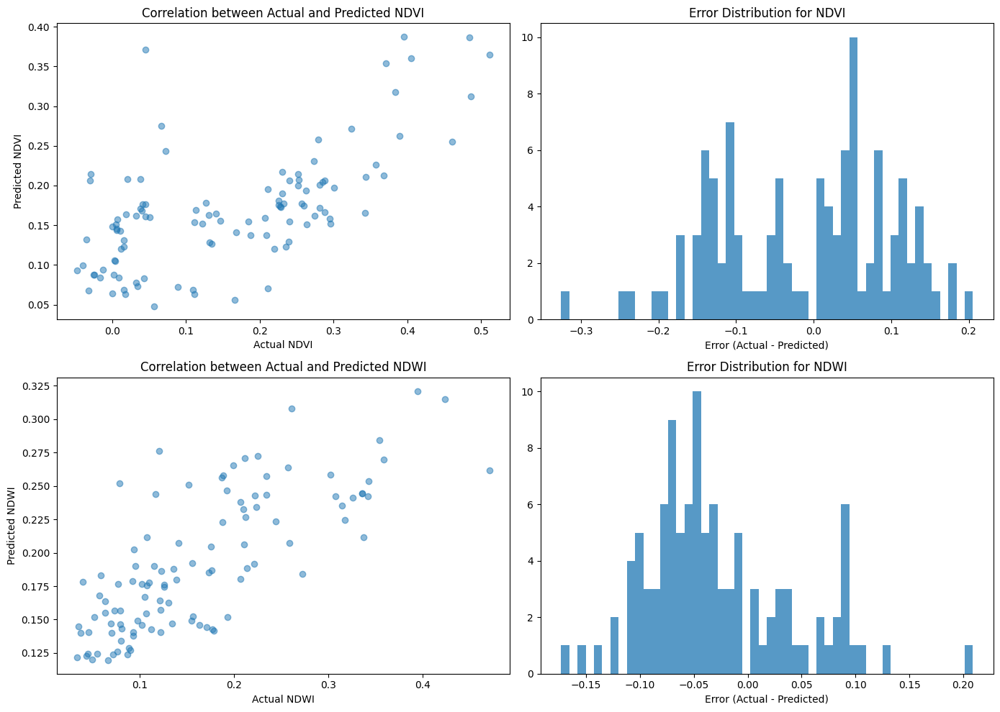

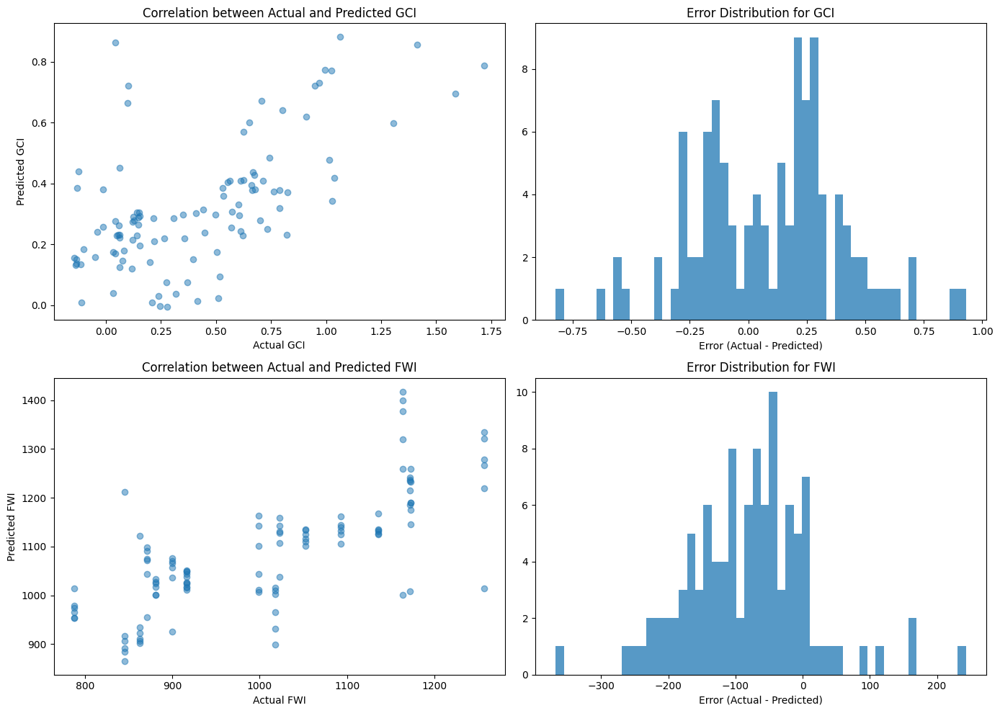

In [108]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Prepare data for TFT-like model
def create_sequences(data, sequence_length):
    xs, ys = [], []
    for i in range(len(data) - sequence_length):
        x = data[i:i + sequence_length]
        y = data[i + sequence_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

X_train, y_train = create_sequences(train_data, sequence_length)
X_test, y_test = create_sequences(test_data, sequence_length)

# Build the TFT-like model
def build_tft_model(input_shape):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.LSTM(128, return_sequences=True)(inputs)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.LSTM(128)(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    outputs = tf.keras.layers.Dense(features)(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model

input_shape = (X_train.shape[1], X_train.shape[2])
model = build_tft_model(input_shape)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=batch_size, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(y_test)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Remove '.shp' from shapefile names
df['Shapefile'] = df['Shapefile'].str.replace('.shp', '')

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()
dates = df['Date'][train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


Epoch 1/5
16105/16105 [==============================] - 28s 2ms/step - loss: 3849.0583 - val_loss: 202.5465
Epoch 2/5
16105/16105 [==============================] - 27s 2ms/step - loss: 618.5759 - val_loss: 299.0007
Epoch 3/5
16105/16105 [==============================] - 27s 2ms/step - loss: 602.6852 - val_loss: 105.4858
Epoch 4/5
16105/16105 [==============================] - 25s 2ms/step - loss: 593.0441 - val_loss: 111.6061
Epoch 5/5
5033/5033 [==============================] - 4s 778us/step
TFT for AgriculturalLand.shp - FWI RMSE: 23.672817484381493, NDVI RMSE: 0.18150878224111996, NDWI RMSE: 0.1260897490157113, GCI RMSE: 0.5377606788907334
Epoch 1/5
16105/16105 [==============================] - 26s 2ms/step - loss: 3887.7585 - val_loss: 71.2204
Epoch 2/5
16105/16105 [==============================] - 25s 2ms/step - loss: 623.3110 - val_loss: 57.8723
Epoch 3/5
16105/16105 [==============================] - 25s 2ms/step - loss: 596.0338 - val_loss: 114.2787
Epoch 4/5
16105/16105 

C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


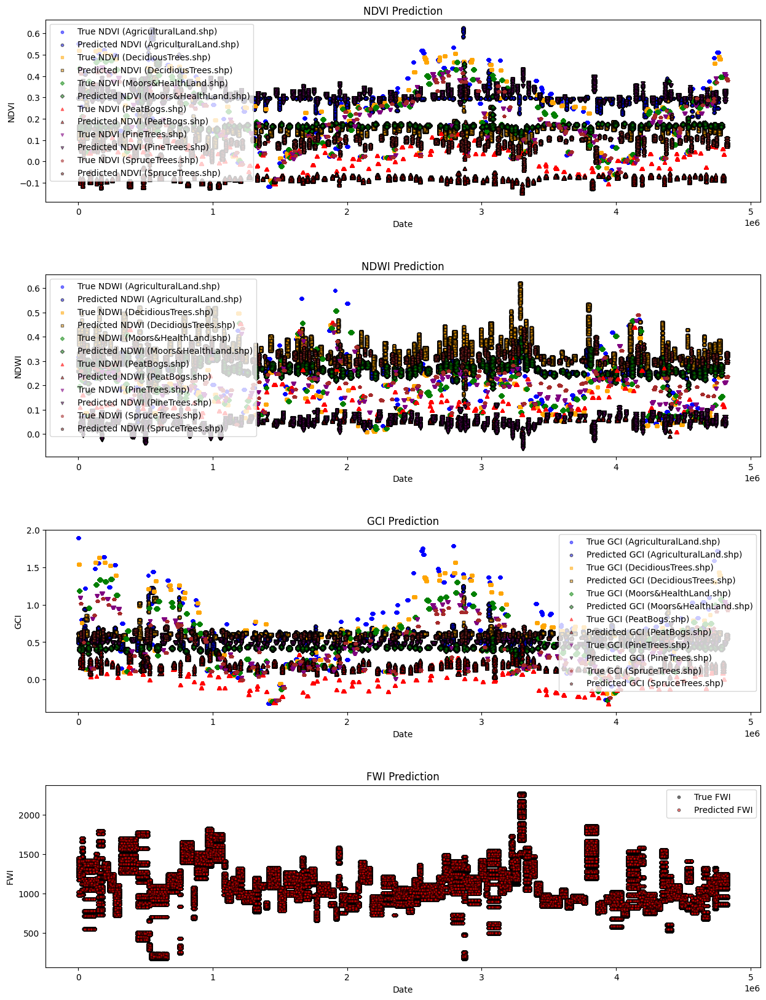

In [48]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LayerNormalization, MultiHeadAttention, Dropout, Layer, Conv1D, Flatten, Add
import matplotlib.pyplot as plt

# Function to build the TFT model
class AddAndNorm(Layer):
    def __init__(self, **kwargs):
        super(AddAndNorm, self).__init__(**kwargs)
        self.norm = LayerNormalization()

    def call(self, inputs, sublayer):
        return self.norm(Add()([inputs, sublayer]))

def build_tft(input_shape):
    # Input layers
    inputs = Input(shape=input_shape)

    # Conv1D layer to capture spatial relationships
    x = Conv1D(filters=64, kernel_size=1, activation='relu')(inputs)

    # Multi-Head Attention
    attn_output = MultiHeadAttention(num_heads=4, key_dim=2)(x, x)
    attn_output = Dropout(0.1)(attn_output)
    x = AddAndNorm()(inputs=x, sublayer=attn_output)

    # Flatten layer
    x = Flatten()(x)

    # Fully connected layers
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.1)(x)
    outputs = Dense(len(targets))(x)  # Output should match the number of target variables

    # Build and compile model
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mean_squared_error')

    return model

# Assuming combined_df is already created as shown in your previous code
# Separate the vegetation types
vegetation_types = combined_df['Shapefile'].unique()

# Define features and targets
features = ['Backscatter', 'Temperature', 'Precipitation_x', 'WindSpeed', 'RelativeHumidity']
targets = ['FWI', 'NDVI', 'NDWI', 'GCI']

# Prepare the plots
fig, axes = plt.subplots(4, 1, figsize=(15, 20))
plt.subplots_adjust(hspace=0.4)

colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']
markers = ['o', 's', 'D', '^', 'v', 'p']
color_marker_dict = dict(zip(vegetation_types, zip(colors, markers)))

# Iterate over each vegetation type
for veg_type in vegetation_types:
    veg_data = combined_df[combined_df['Shapefile'] == veg_type]

    # Train-test split
    X = veg_data[features]
    y = veg_data[targets]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Standardize the data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Reshape for TFT [samples, time steps, features]
    X_train_tft = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
    X_test_tft = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

    tft_model = build_tft(X_train_tft.shape[1:])
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    tft_model.fit(X_train_tft, y_train, epochs=5, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

    # Predict using TFT
    tft_predictions = tft_model.predict(X_test_tft)

    # Calculate RMSE for TFT
    tft_rmse_fwi = np.sqrt(mean_squared_error(y_test['FWI'], tft_predictions[:, 0]))
    tft_rmse_ndvi = np.sqrt(mean_squared_error(y_test['NDVI'], tft_predictions[:, 1]))
    tft_rmse_ndwi = np.sqrt(mean_squared_error(y_test['NDWI'], tft_predictions[:, 2]))
    tft_rmse_gci = np.sqrt(mean_squared_error(y_test['GCI'], tft_predictions[:, 3]))
    print(f"TFT for {veg_type} - FWI RMSE: {tft_rmse_fwi}, NDVI RMSE: {tft_rmse_ndvi}, NDWI RMSE: {tft_rmse_ndwi}, GCI RMSE: {tft_rmse_gci}")

    # Plotting the results with scatter plots
    color, marker = color_marker_dict[veg_type]

    # Plot NDVI
    axes[0].scatter(y_test.index, y_test['NDVI'], label=f'True NDVI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[0].scatter(y_test.index, tft_predictions[:, 1], label=f'Predicted NDVI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

    # Plot NDWI
    axes[1].scatter(y_test.index, y_test['NDWI'], label=f'True NDWI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[1].scatter(y_test.index, tft_predictions[:, 2], label=f'Predicted NDWI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

    # Plot GCI
    axes[2].scatter(y_test.index, y_test['GCI'], label=f'True GCI ({veg_type})', color=color, alpha=0.5, s=10, marker=marker)
    axes[2].scatter(y_test.index, tft_predictions[:, 3], label=f'Predicted GCI ({veg_type})', color=color, alpha=0.5, s=10, edgecolor='k', marker=marker)

# Plot FWI (independent of vegetation type)
X = combined_df[features]
y = combined_df['FWI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape for TFT [samples, time steps, features]
X_train_tft = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_tft = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

tft_model = build_tft(X_train_tft.shape[1:])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

tft_model.fit(X_train_tft, y_train, epochs=50, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

# Predict using TFT
tft_predictions = tft_model.predict(X_test_tft)

# Calculate RMSE for TFT
tft_rmse_fwi = np.sqrt(mean_squared_error(y_test, tft_predictions[:, 0]))
print(f"TFT - FWI RMSE: {tft_rmse_fwi}")

# Plotting the results with scatter plots
axes[3].scatter(y_test.index, y_test, label='True FWI', color='black', alpha=0.5, s=10, marker='o')
axes[3].scatter(y_test.index, tft_predictions[:, 0], label='Predicted FWI', color='red', alpha=0.5, s=10, edgecolor='k', marker='o')

# Set titles and labels
axes[0].set_title('NDVI Prediction')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('NDVI')
axes[0].legend()

axes[1].set_title('NDWI Prediction')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('NDWI')
axes[1].legend()

axes[2].set_title('GCI Prediction')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('GCI')
axes[2].legend()

axes[3].set_title('FWI Prediction')
axes[3].set_xlabel('Date')
axes[3].set_ylabel('FWI')
axes[3].legend()

plt.show()


In [27]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Load your dataset
# combined_df = pd.read_csv('your_dataset.csv') # Example

# Define feature columns and target columns
features = ['Backscatter', 'Temperature', 'Precipitation_x', 'WindSpeed', 'RelativeHumidity']
targets = ['FWI', 'NDVI', 'NDWI', 'GCI']

# Select features and targets
X = combined_df[features]
y = combined_df[targets]

# Normalize the features
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

# Normalize the targets
scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

# Convert to time series data
def create_sequences(X, y, seq_length):
    generator = TimeseriesGenerator(X, y, length=seq_length, batch_size=1)
    return generator

seq_length = 10  # Example sequence length
train_gen = create_sequences(X_train, y_train, seq_length)
test_gen = create_sequences(X_test, y_test, seq_length)


## LSTM

In [31]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Load your dataset
# combined_df = pd.read_csv('your_dataset.csv') # Example

# Define feature columns and target columns
features = ['Backscatter', 'Temperature', 'Precipitation_x', 'WindSpeed', 'RelativeHumidity']
targets = ['FWI', 'NDVI', 'NDWI', 'GCI']

# Select features and targets
X = combined_df[features]
y = combined_df[targets]

# Normalize the features
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

# Normalize the targets
scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

# Convert to time series data
def create_sequences(X, y, seq_length, batch_size):
    generator = TimeseriesGenerator(X, y, length=seq_length, batch_size=batch_size)
    return generator

seq_length = 5  # Reduced sequence length for quicker testing
batch_size = 64  # Larger batch size

train_gen = create_sequences(X_train, y_train, seq_length, batch_size)
test_gen = create_sequences(X_test, y_test, seq_length, batch_size)

# Build a simpler LSTM model
def build_simpler_lstm_model(input_shape, output_dim):
    model = Sequential()
    model.add(LSTM(20, activation='relu', input_shape=input_shape))
    model.add(Dense(output_dim))
    model.compile(optimizer='adam', loss='mse')
    return model

input_shape = (seq_length, len(features))
output_dim = len(targets)

simpler_lstm_model = build_simpler_lstm_model(input_shape, output_dim)

# Training the model with early stopping and model checkpointing
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=3)
model_checkpoint = ModelCheckpoint('best_lstm_model.h5', monitor='val_loss', save_best_only=True)

# Training with a smaller subset for quicker iteration
X_train_sample, y_train_sample = X_train[:10000], y_train[:10000]
train_gen_sample = create_sequences(X_train_sample, y_train_sample, seq_length, batch_size)

simpler_lstm_model.fit(train_gen_sample, epochs=10, validation_data=test_gen, callbacks=[early_stopping, model_checkpoint])

# Evaluate on the test set
loss = simpler_lstm_model.evaluate(test_gen)
print(f'Test Loss: {loss}')


Epoch 1/10
157/157 [==============================] - 16s 97ms/step - loss: 1.6250 - val_loss: 1.2580
Epoch 2/10
 57/157 [=========>....................] - ETA: 0s - loss: 0.2785

C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


157/157 [==============================] - 15s 98ms/step - loss: 0.2818 - val_loss: 1.3826
Epoch 3/10
157/157 [==============================] - 15s 96ms/step - loss: 0.2456 - val_loss: 1.4373
Epoch 4/10
15099/15099 [==============================] - 17s 1ms/step - loss: 1.6024
Test Loss: 1.6024174690246582


Epoch 1/50
15/15 [==============================] - 2s 39ms/step - loss: 0.1808 - val_loss: 0.0839
Epoch 2/50
15/15 [==============================] - 0s 16ms/step - loss: 0.0830 - val_loss: 0.0781
Epoch 3/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0720 - val_loss: 0.0699
Epoch 4/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0673 - val_loss: 0.0658
Epoch 5/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0616 - val_loss: 0.0636
Epoch 6/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0584 - val_loss: 0.0597
Epoch 7/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0543 - val_loss: 0.0567
Epoch 8/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0520 - val_loss: 0.0552
Epoch 9/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0491 - val_loss: 0.0514
Epoch 10/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0463 - val_loss: 0.0484
Epoch 11/

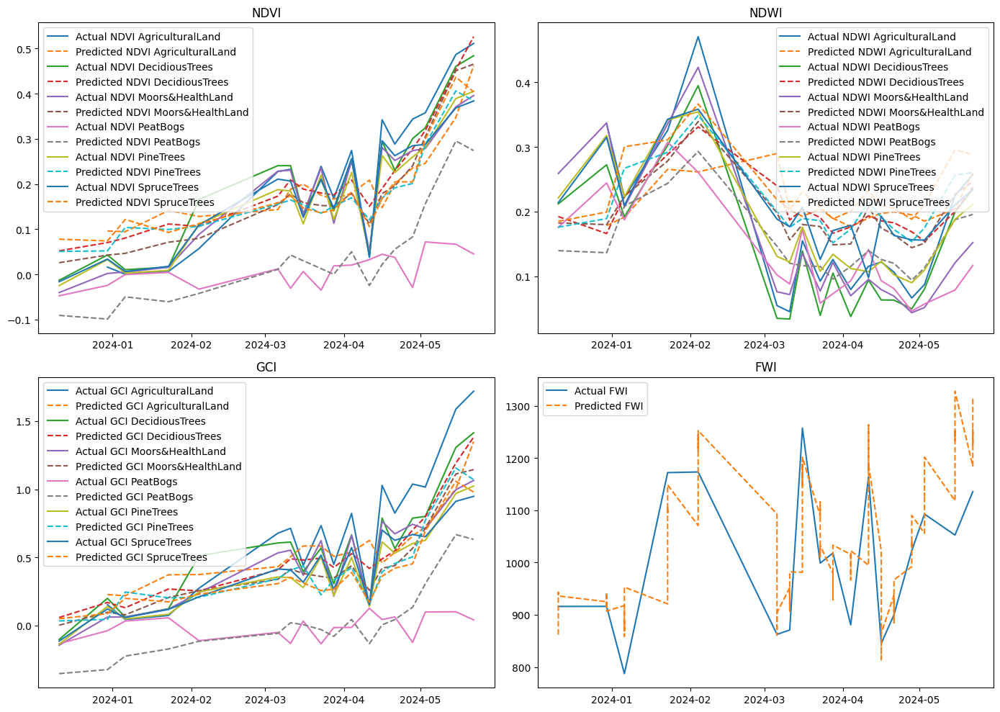

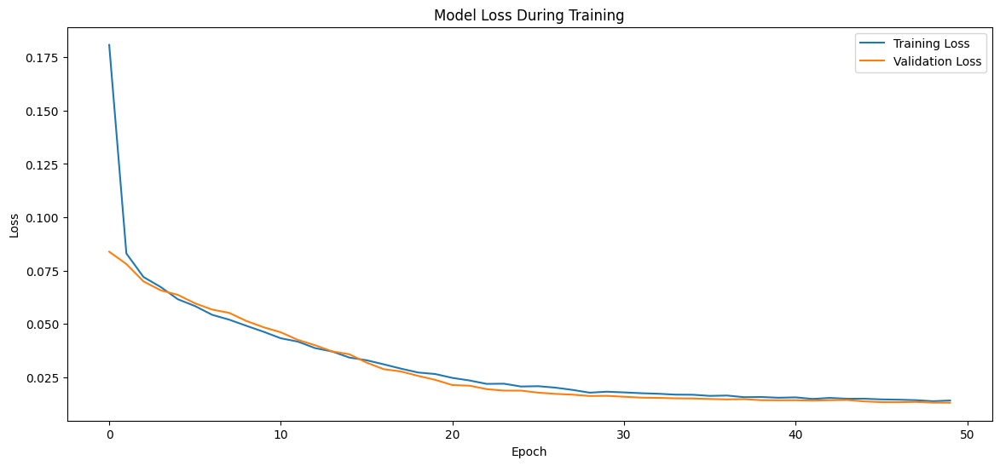

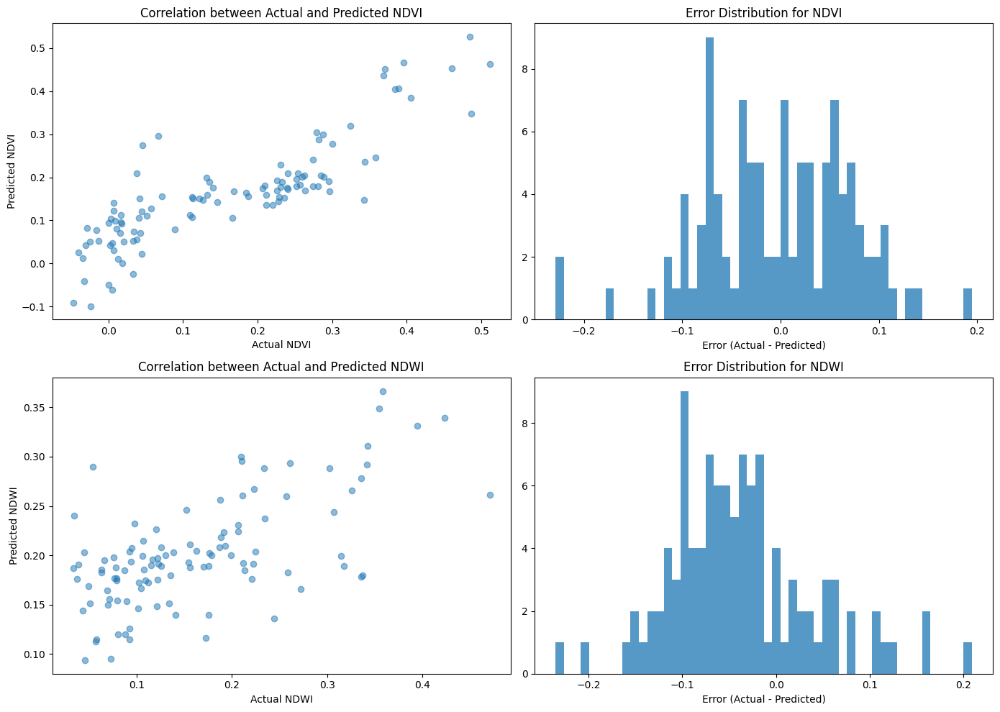

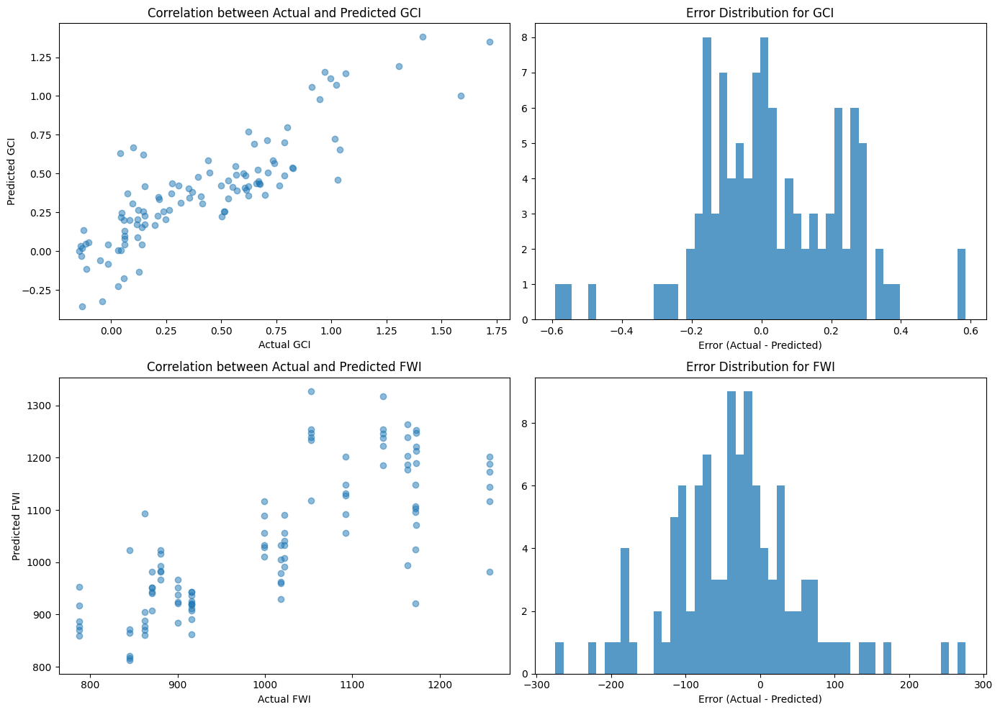

In [142]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


Epoch 1/50
15/15 [==============================] - 2s 30ms/step - loss: 0.1803 - val_loss: 0.0855
Epoch 2/50
15/15 [==============================] - 0s 12ms/step - loss: 0.0661 - val_loss: 0.0517
Epoch 3/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0481 - val_loss: 0.0459
Epoch 4/50
15/15 [==============================] - 0s 13ms/step - loss: 0.0423 - val_loss: 0.0443
Epoch 5/50
15/15 [==============================] - 0s 18ms/step - loss: 0.0391 - val_loss: 0.0411
Epoch 6/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0371 - val_loss: 0.0401
Epoch 7/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0348 - val_loss: 0.0389
Epoch 8/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0324 - val_loss: 0.0362
Epoch 9/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0317 - val_loss: 0.0349
Epoch 10/50
15/15 [==============================] - 0s 12ms/step - loss: 0.0311 - val_loss: 0.0344
Epoch 11/

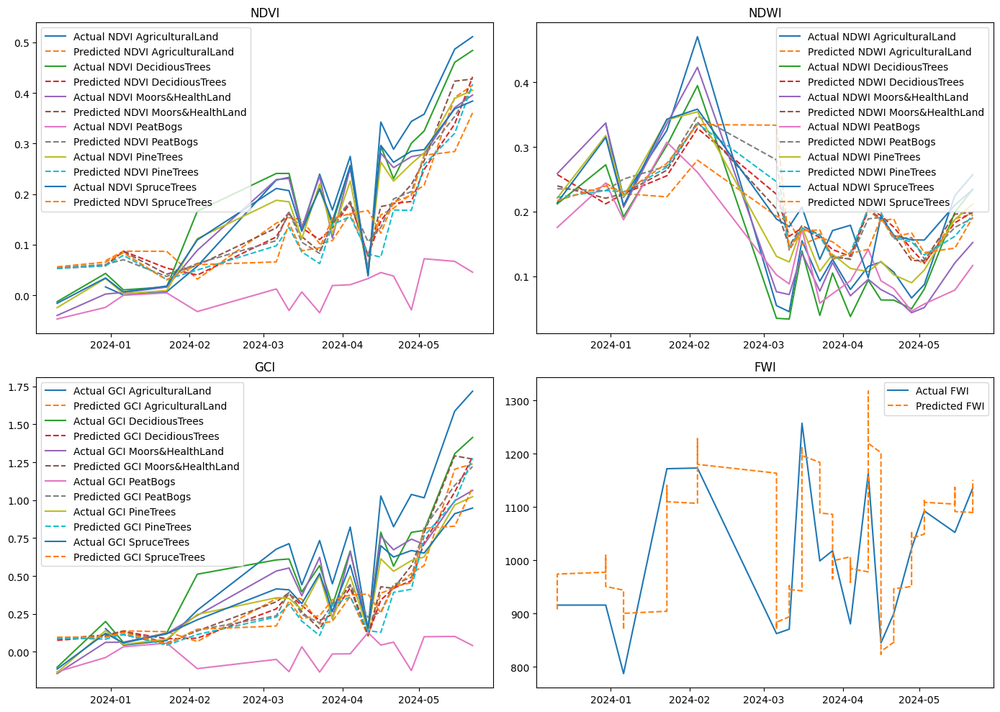

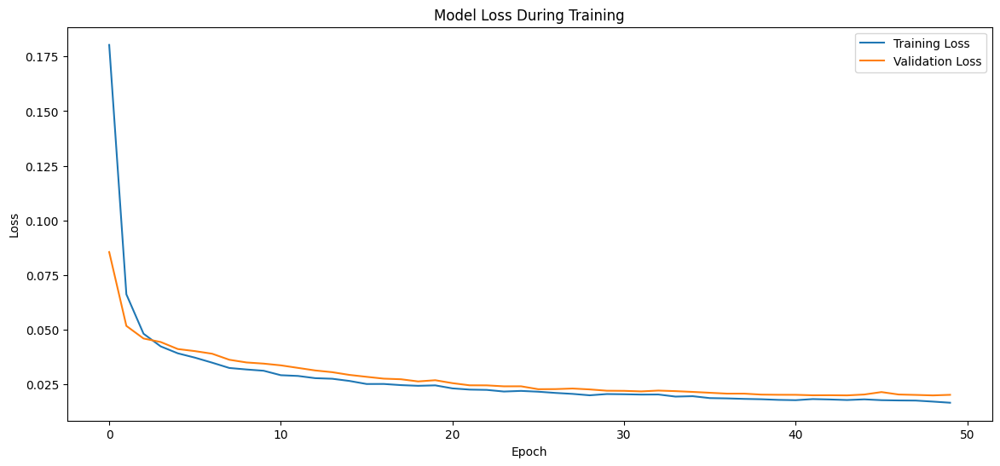

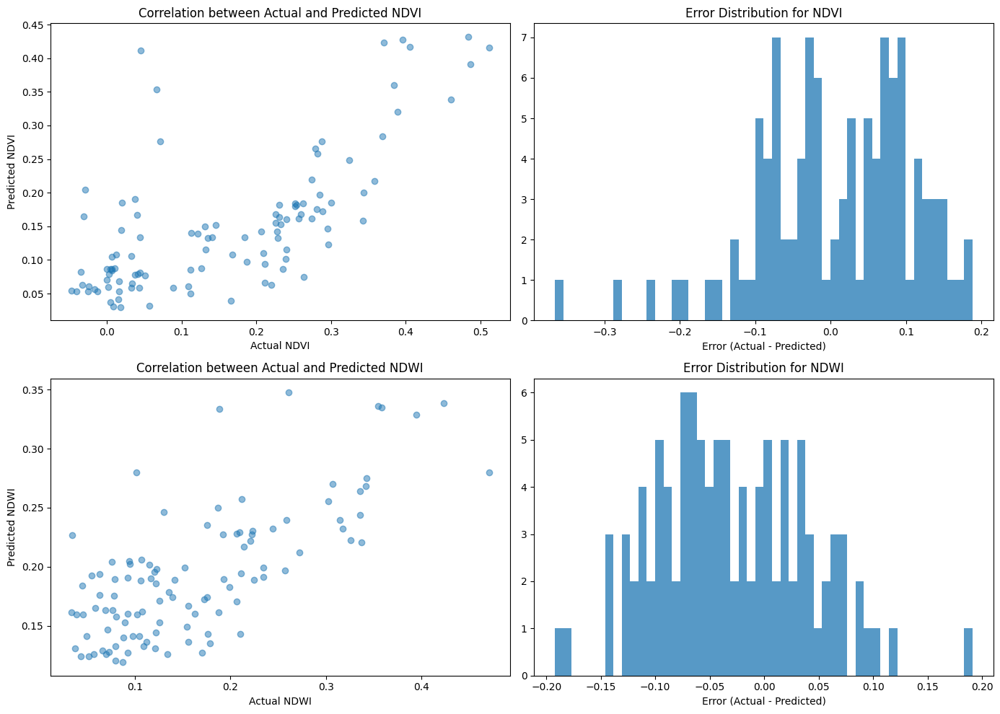

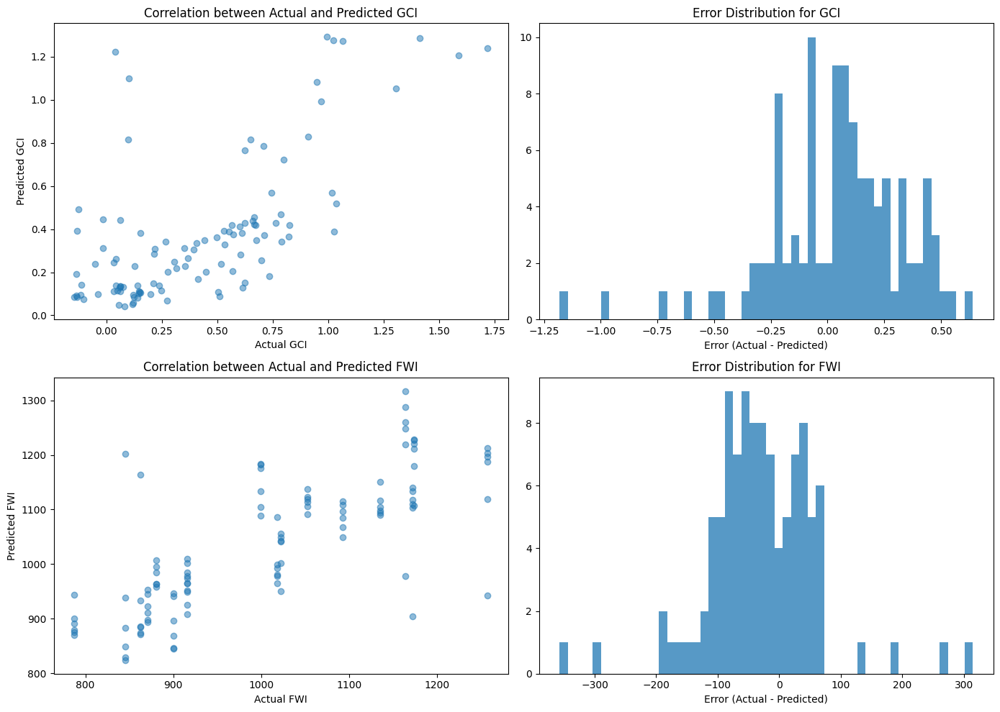

In [145]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Remove '.shp' from shapefile names
df['Shapefile'] = df['Shapefile'].str.replace('.shp', '')

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()
dates = df['Date'][train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## XLSTM

Epoch 1/50
15/15 [==============================] - 2s 39ms/step - loss: 0.1941 - val_loss: 0.1115
Epoch 2/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0957 - val_loss: 0.0811
Epoch 3/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0768 - val_loss: 0.0738
Epoch 4/50
15/15 [==============================] - 0s 17ms/step - loss: 0.0698 - val_loss: 0.0692
Epoch 5/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0647 - val_loss: 0.0655
Epoch 6/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0621 - val_loss: 0.0622
Epoch 7/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0579 - val_loss: 0.0579
Epoch 8/50
15/15 [==============================] - 0s 20ms/step - loss: 0.0549 - val_loss: 0.0552
Epoch 9/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0519 - val_loss: 0.0521
Epoch 10/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0481 - val_loss: 0.0486
Epoch 11/

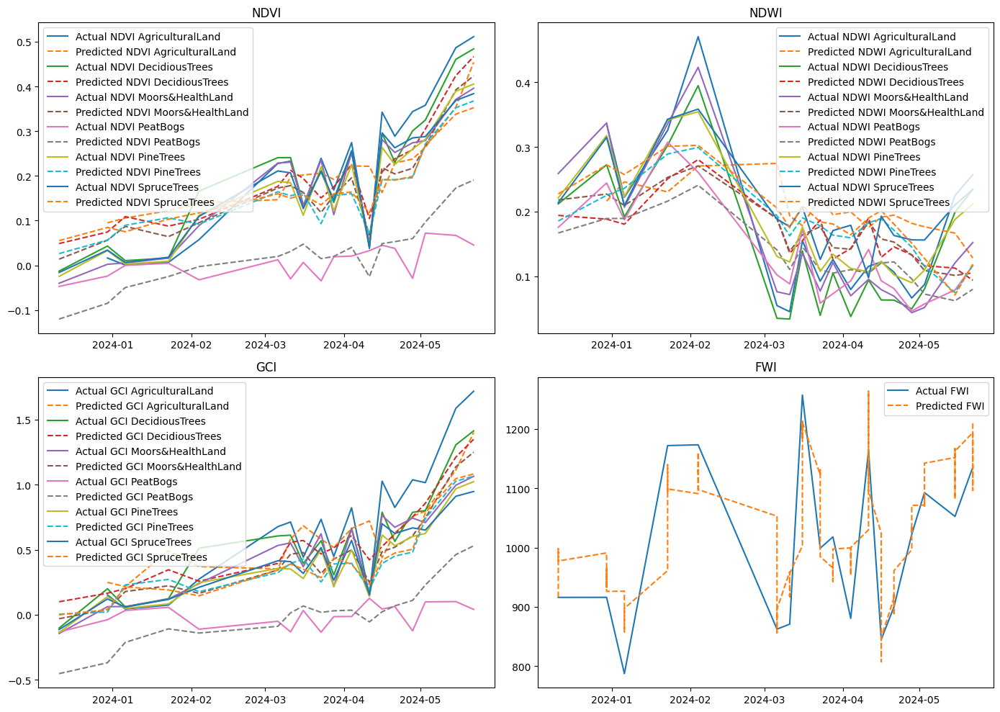

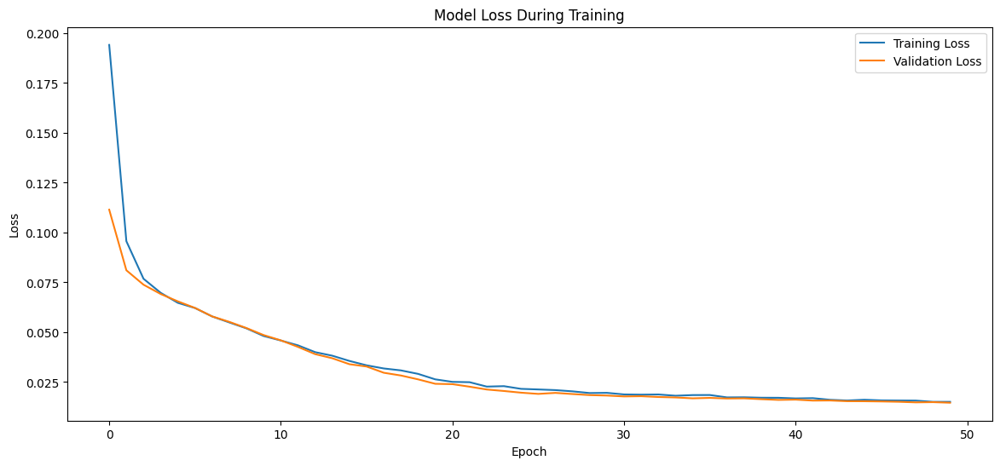

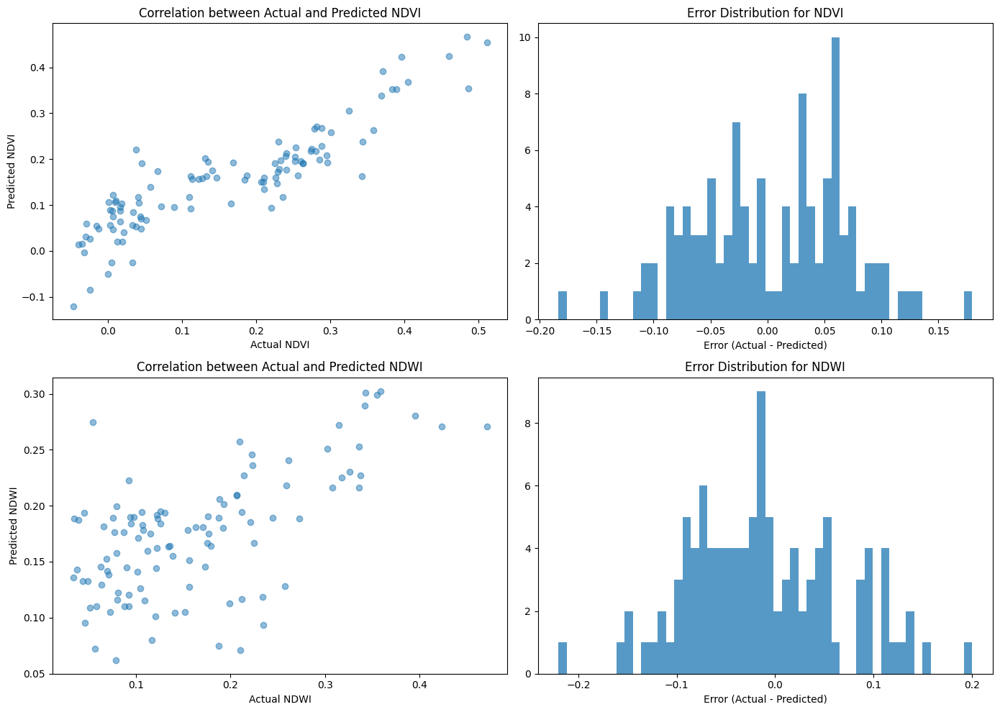

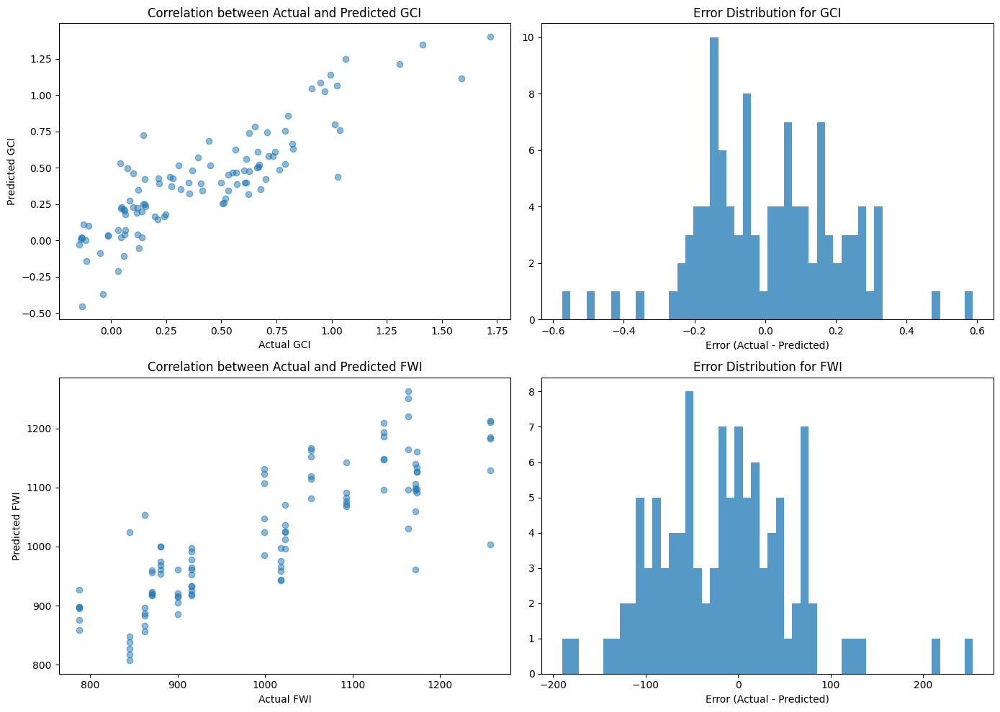

In [141]:

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')  # No need to adjust index since we did not drop columns earlier
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## TFT

C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



Epoch 1/50
15/15 [==============================] - 3s 49ms/step - loss: 442196736.0000 - val_loss: 353181824.0000
Epoch 2/50
15/15 [==============================] - 1s 38ms/step - loss: 184322144.0000 - val_loss: 165704880.0000
Epoch 3/50
15/15 [==============================] - 1s 41ms/step - loss: 72503080.0000 - val_loss: 132456544.0000
Epoch 4/50
15/15 [==============================] - 1s 41ms/step - loss: 36526496.0000 - val_loss: 126427920.0000
Epoch 5/50
15/15 [==============================] - 1s 38ms/step - loss: 21377764.0000 - val_loss: 17090938.0000
Epoch 6/50
15/15 [==============================] - 1s 39ms/step - loss: 10667940.0000 - val_loss: 12032872.0000
Epoch 7/50
15/15 [==============================] - 0s 31ms/step - loss: 4813403.0000 - val_loss: 11030660.0000
Epoch 8/50
15/15 [==============================] - 1s 36ms/step - loss: 3145759.0000 - val_loss: 5506135.5000
Epoch 9/50
15/15 [==============================] - 1s 40ms/step - loss: 2157953.2500 - val_l

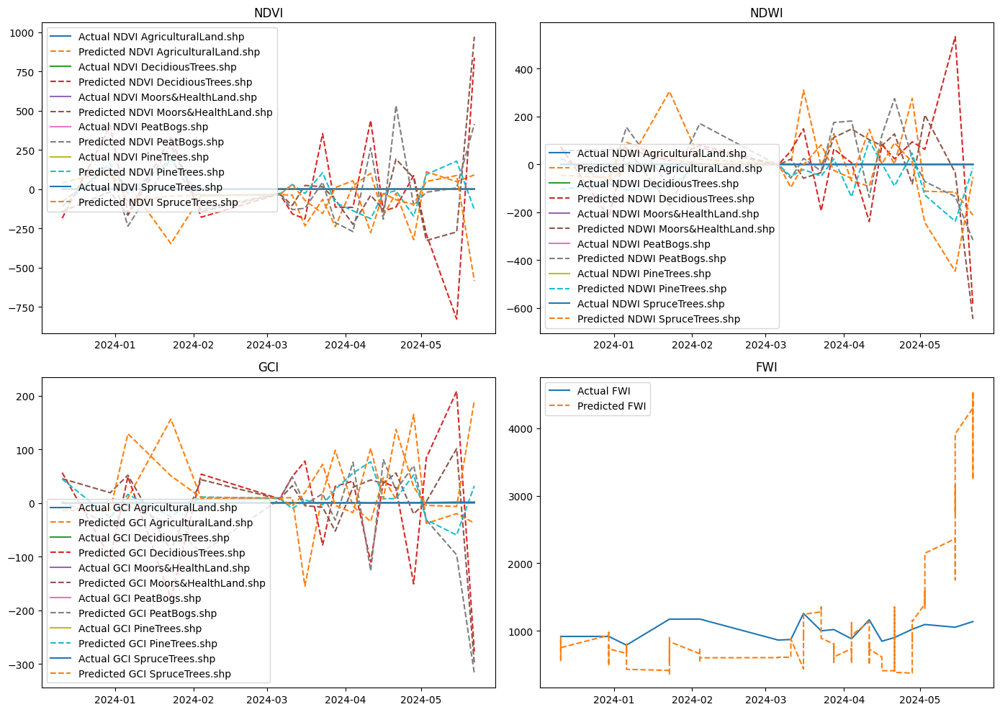

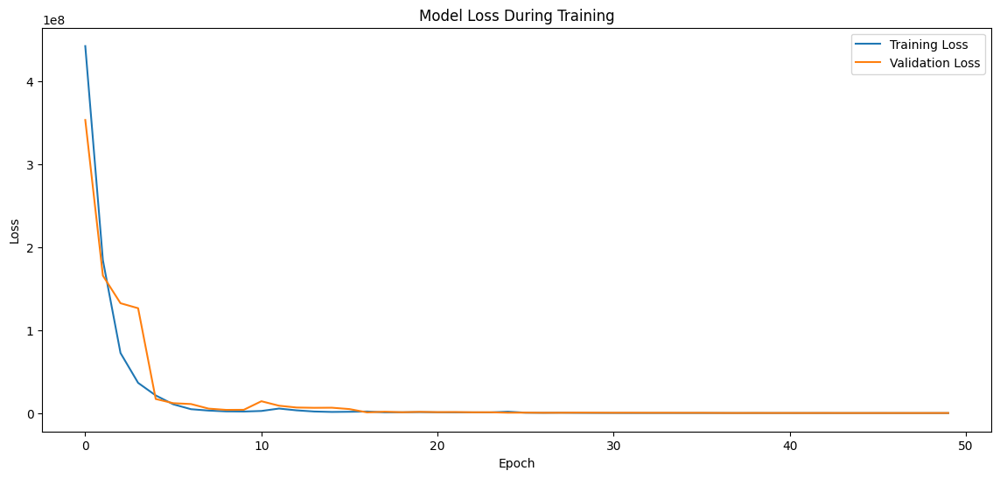

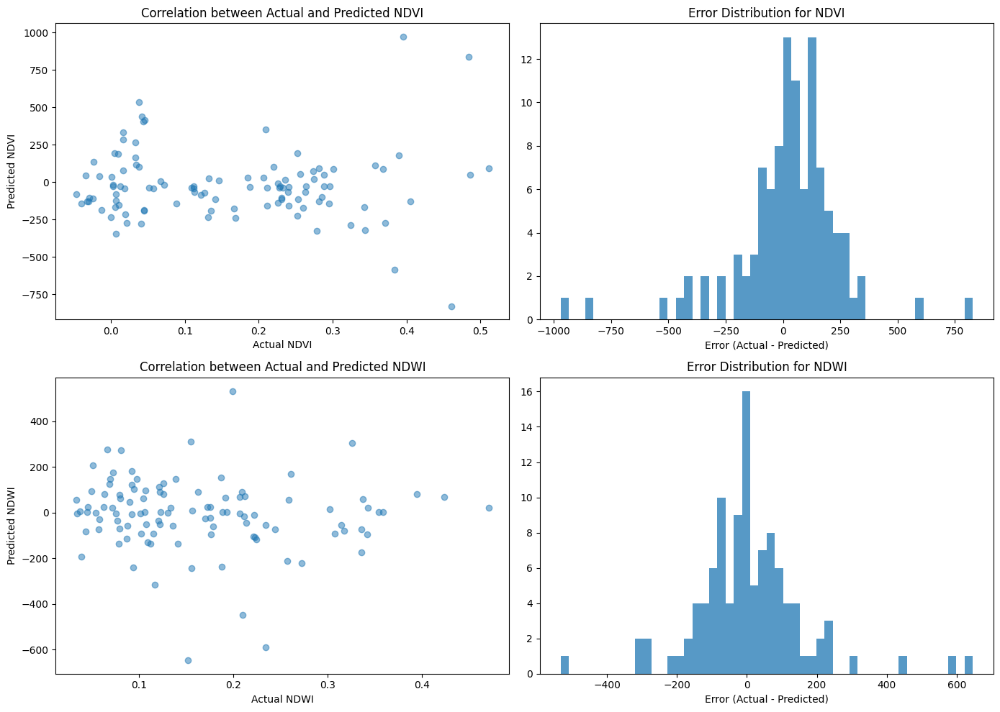

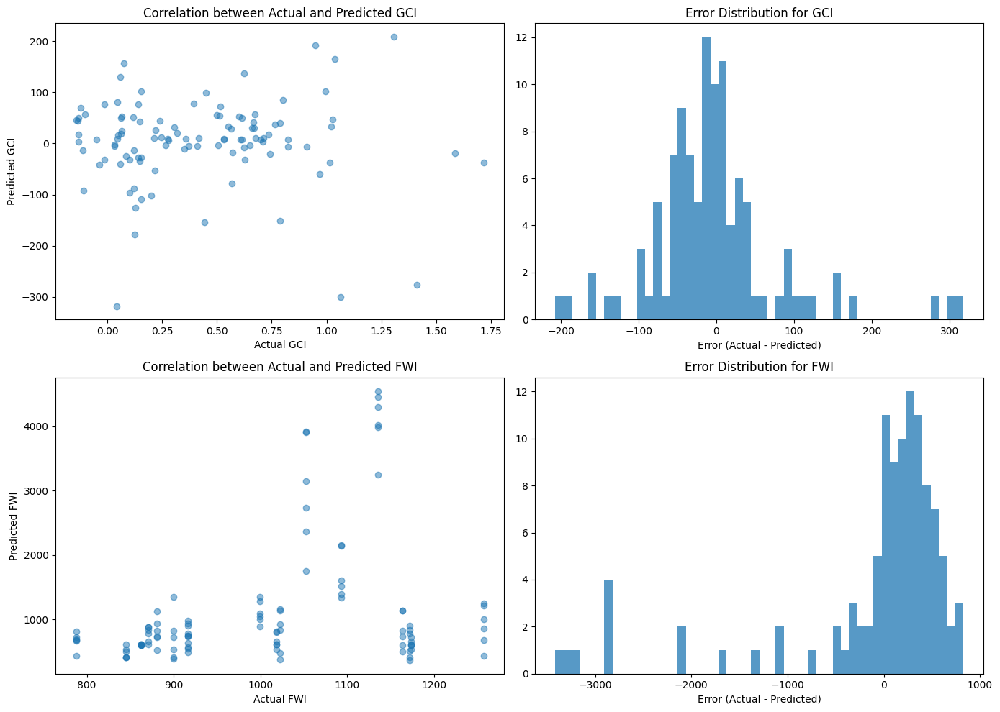

In [150]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
encoder = OneHotEncoder(sparse=False)
shapefile_encoded = encoder.fit_transform(df[['Shapefile']])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, pd.DataFrame(shapefile_encoded, columns=encoder.get_feature_names_out())], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = df.shape[1]

# Split the data into training and testing sets
train_size = int(len(df) * 0.8)
train_data = df[:train_size]
test_data = df[train_size:]

def create_sequences(data, target_indices, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length, :])
        y.append(data[i + sequence_length, target_indices])
    return np.array(X), np.array(y)

# Create sequences
target_indices = [df.columns.get_loc(col) for col in ['NDVI', 'NDWI', 'GCI', 'FWI']]
X_train, y_train = create_sequences(train_data.values, target_indices, sequence_length)
X_test, y_test = create_sequences(test_data.values, target_indices, sequence_length)

# Build the TFT model using TensorFlow/Keras
def build_tft_model(input_shape, output_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(100, activation='relu', return_sequences=True)(inputs)
    x = LSTM(100, activation='relu')(x)
    x = Dropout(0.2)(x)
    outputs = Dense(output_shape)(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model

input_shape = X_train.shape[1:]
output_shape = len(target_indices)

model = build_tft_model(input_shape, output_shape)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=batch_size, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Extract individual targets from predictions and actual values
predicted_ndvi, predicted_ndwi, predicted_gci, predicted_fwi = predictions.T
actual_ndvi, actual_ndwi, actual_gci, actual_fwi = y_test.T

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


Epoch 1/50
15/15 [==============================] - 2s 30ms/step - loss: 0.1829 - val_loss: 0.0979
Epoch 2/50
15/15 [==============================] - 0s 22ms/step - loss: 0.0995 - val_loss: 0.0827
Epoch 3/50
15/15 [==============================] - 0s 24ms/step - loss: 0.0812 - val_loss: 0.0739
Epoch 4/50
15/15 [==============================] - 0s 18ms/step - loss: 0.0725 - val_loss: 0.0695
Epoch 5/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0670 - val_loss: 0.0668
Epoch 6/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0632 - val_loss: 0.0635
Epoch 7/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0585 - val_loss: 0.0618
Epoch 8/50
15/15 [==============================] - 0s 19ms/step - loss: 0.0560 - val_loss: 0.0577
Epoch 9/50
15/15 [==============================] - 0s 22ms/step - loss: 0.0528 - val_loss: 0.0540
Epoch 10/50
15/15 [==============================] - 0s 16ms/step - loss: 0.0501 - val_loss: 0.0512
Epoch 11/

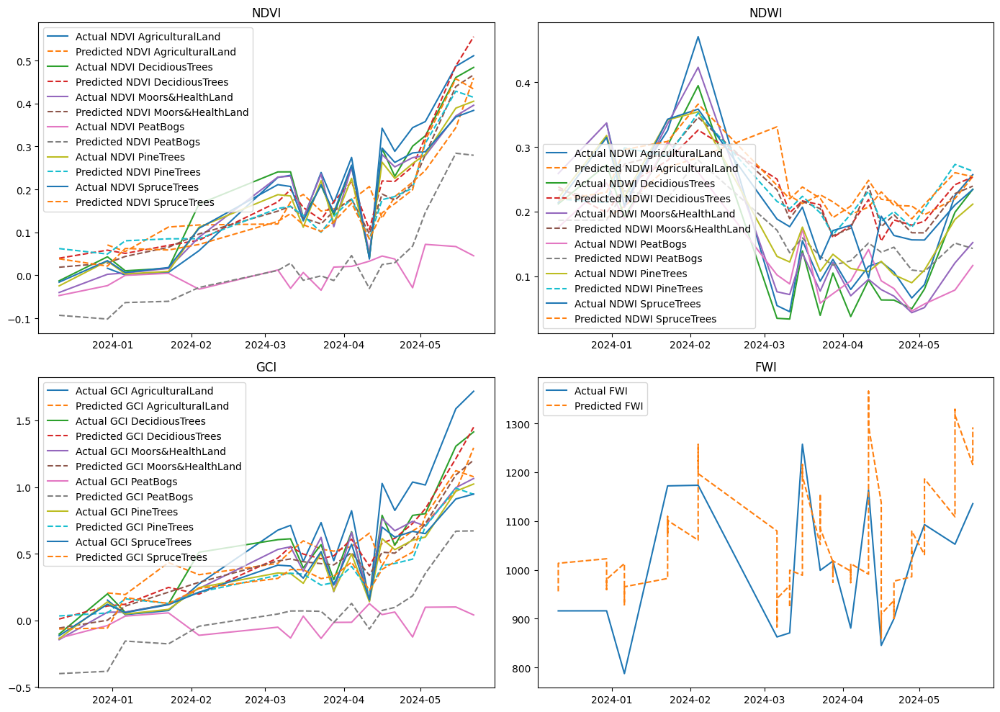

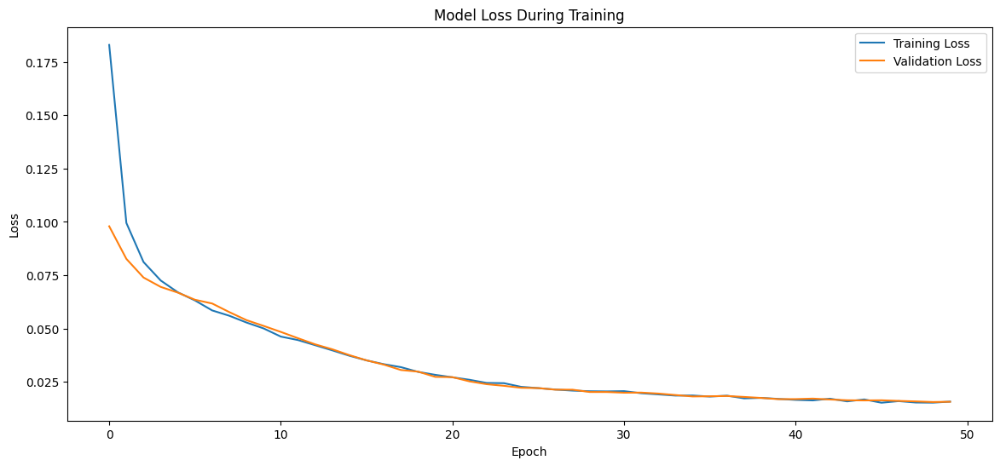

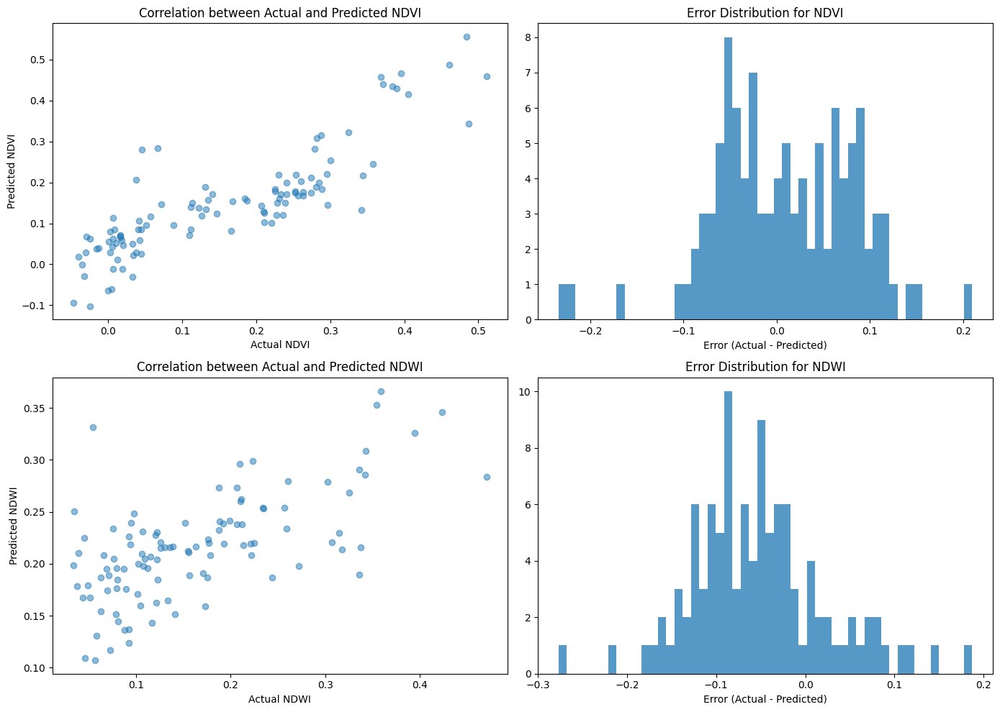

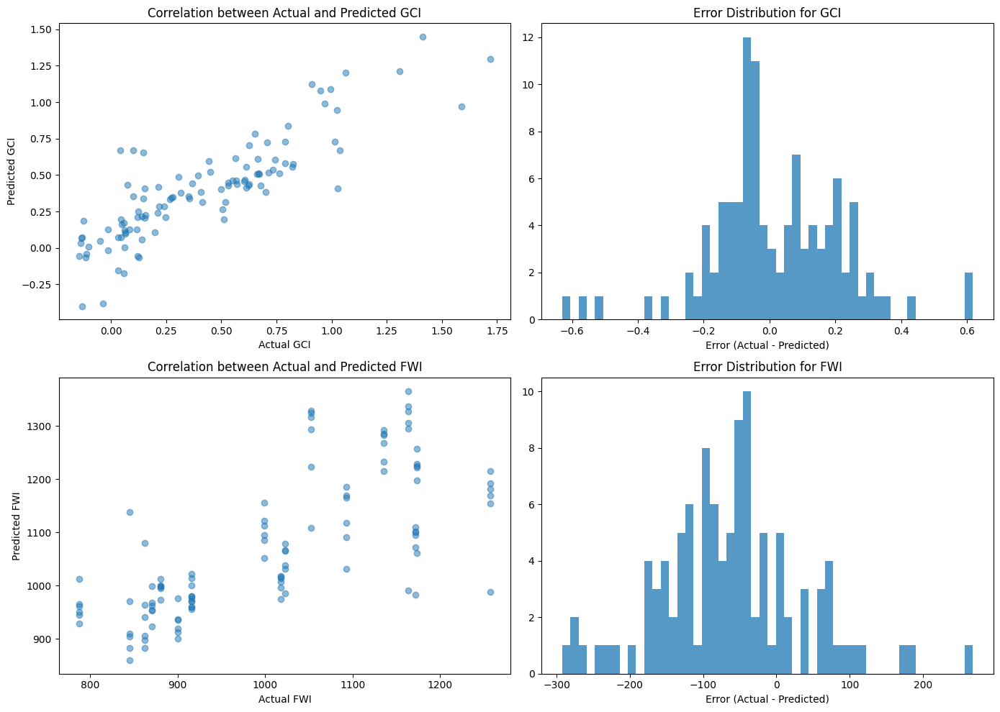

In [159]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the TFT model using LSTM layers for simplicity
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')  # No need to adjust index since we did not drop columns earlier
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## MAMBA

Epoch 1/50
15/15 [==============================] - 5s 75ms/step - loss: 0.1821 - val_loss: 0.1001
Epoch 2/50
15/15 [==============================] - 1s 32ms/step - loss: 0.0952 - val_loss: 0.0766
Epoch 3/50
15/15 [==============================] - 1s 36ms/step - loss: 0.0702 - val_loss: 0.0769
Epoch 4/50
15/15 [==============================] - 1s 43ms/step - loss: 0.0618 - val_loss: 0.0742
Epoch 5/50
15/15 [==============================] - 1s 36ms/step - loss: 0.0597 - val_loss: 0.0728
Epoch 6/50
15/15 [==============================] - 1s 36ms/step - loss: 0.0581 - val_loss: 0.0716
Epoch 7/50
15/15 [==============================] - 0s 25ms/step - loss: 0.0560 - val_loss: 0.0694
Epoch 8/50
15/15 [==============================] - 1s 33ms/step - loss: 0.0534 - val_loss: 0.0670
Epoch 9/50
15/15 [==============================] - 1s 35ms/step - loss: 0.0514 - val_loss: 0.0642
Epoch 10/50
15/15 [==============================] - 1s 38ms/step - loss: 0.0485 - val_loss: 0.0597
Epoch 11/

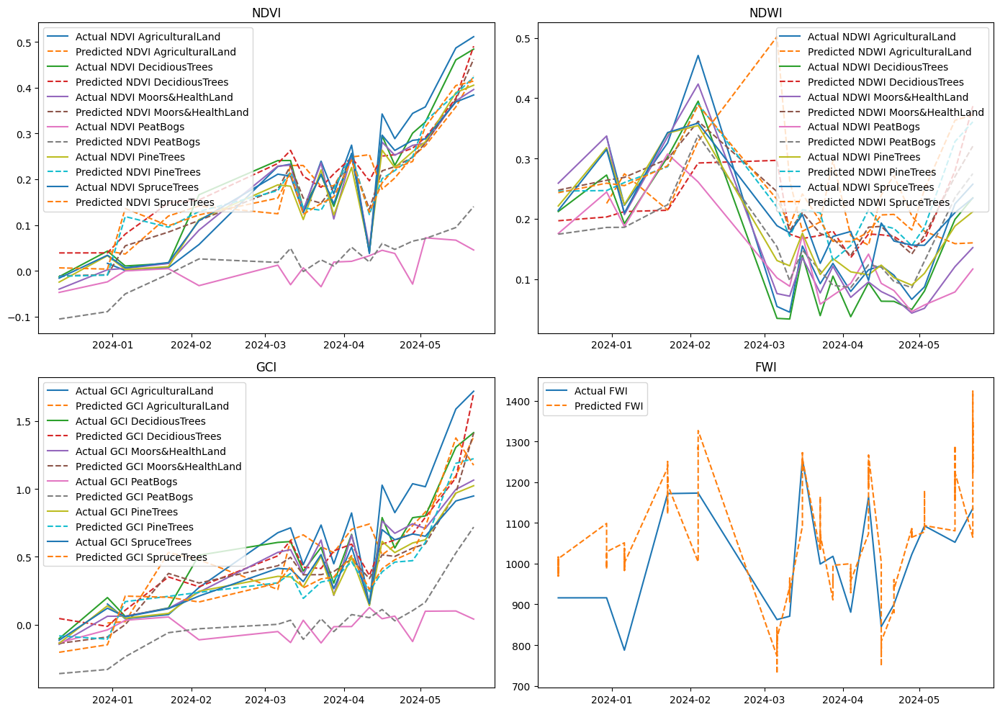

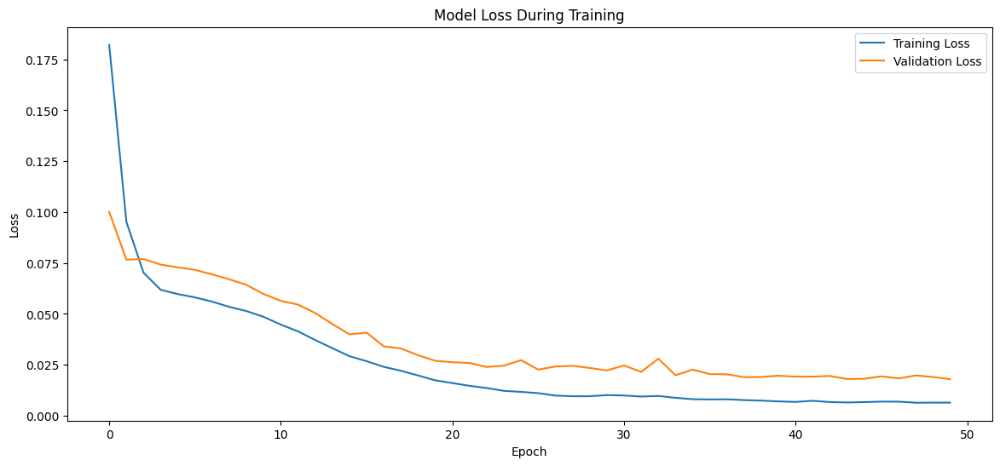

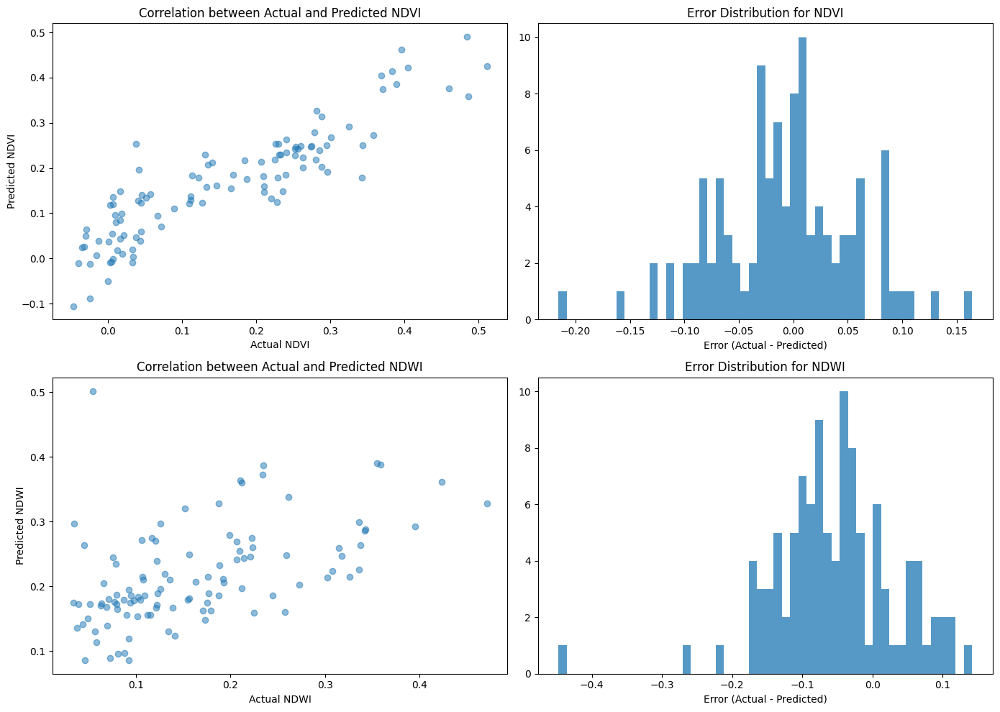

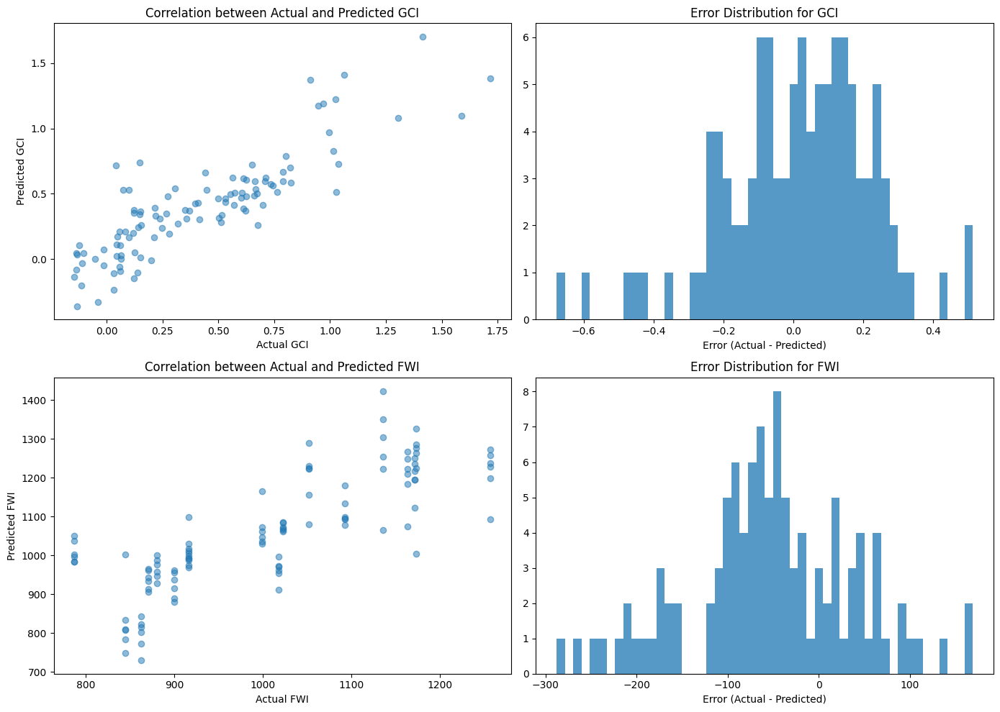

In [131]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Bidirectional, Layer
import matplotlib.pyplot as plt
import tensorflow as tf

# Define the Attention Layer
class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], input_shape[-1]), initializer='glorot_uniform', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[-1],), initializer='zeros', trainable=True)
        super(Attention, self).build(input_shape)

    def call(self, x):
        e = tf.keras.backend.tanh(tf.keras.backend.dot(x, self.W) + self.b)
        a = tf.keras.backend.softmax(e, axis=1)
        output = x * a
        return tf.keras.backend.sum(output, axis=1)

# Define the Mamba model architecture
def Mamba(input_shape, output_dim):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(100, activation='relu', return_sequences=True))(inputs)
    x = LSTM(50, activation='relu', return_sequences=True)(x)
    x = Attention()(x)
    outputs = Dense(output_dim)(x)
    model = Model(inputs, outputs)
    return model

# Load and preprocess the data
df = pd.read_csv('averaged_combined_timeseries.csv')
df['Date'] = pd.to_datetime(df['Date'])
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month
shapefile_encoded = pd.get_dummies(df['Shapefile'])
shapefile_column = df['Shapefile']
date_column = df['Date']
df = pd.concat([df, shapefile_encoded], axis=1)
df.drop(columns=['Date', 'Shapefile'], inplace=True)
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build and train the Mamba model
input_shape = (sequence_length, features)
output_dim = features
model = Mamba(input_shape, output_dim)
model.compile(optimizer='adam', loss='mse')
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')
predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]
actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)
mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)
mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)
mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})
print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')
plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')
plt.tight_layout()
plt.show()
